In [1]:
from kg.query import query_kg, query_kg_endpoint, get_triples_from_response
import matplotlib.pyplot as plt
import networkx as nx


In [2]:
from utils.kg_functions import load_json, extract_ids_with_prefix, convert_QID_yagoID
from utils.kg_functions import combine_lists_from_dict, get_yago_direct_neighbors, sparql_to_triples_with_main_entity
from utils.kg_functions import parallel_process_nodes, extract_ids_with_prefix, parallel_convert_QID_yagoID

from utils.subgraph_functions import create_graph_from_triples, build_minimal_subgraph_Steiner, largest_connected_subgraph
from utils.subgraph_functions import plot_graph_with_simplified_labels, get_interesting_entities, filter_triples_by_predicates

In [3]:
yago_endpoint_url = "http://localhost:9999/bigdata/sparql"

In [4]:
data = load_json('/home/ubuntu/preetam_experiments/inputs/final_results_train10K_wiki40B.json')

JSON data loaded successfully!


In [5]:
exclude_props = ['knowsLanguage', 'location', 'image', 'about', 'comment', 'gtin', 'url', 'label', 'postalCode', 'isbn', 'sameAs', 'mainEntityOfPage', 'leiCode', 'type', 'dateCreated', 'unemploymentRate', 'length', 'description', 'iswcCode', 'iataCode', 'logo', 'alternateName', 'geo', 'subclassOf', 'icaoCode', 'humanDevelopmentIndex', 'sameAs', 'dateCreated', 'startDate', 'endDate', 'follows', 'superEvent']

# exclude_props = ['schema:image','schema:about', 'rdfs:comment', 'schema:gtin', 'schema:url', 'rdfs:label', 'schema:postalCode', 'schema:isbn', 'schema:sameAs', 'schema:mainEntityOfPage', 'schema:leiCode', 'rdf:type', 'schema:dateCreated', 'yago:unemploymentRate', 'yago:length', 'schema:description', 'yago:iswcCode', 'schema:iataCode', 'schema:logo', 'schema:alternateName', 'schema:geo', 'rdfs:subclassOf', 'schema:icaoCode', 'yago:humanDevelopmentIndex', 'owl:sameAs', 'schema:dateCreated', 'schema:startDate', 'schema:endDate', 'yago:follows', 'schema:superEvent']

In [54]:
idx = 11
keys = list(data.keys())
QID = keys[idx]


interesting_entities = get_interesting_entities(QID, data[QID]['entities'])

results = parallel_process_nodes(interesting_entities)
comb_list = combine_lists_from_dict(results)
comb_list = filter_triples_by_predicates(comb_list, exclude_props)

Length of Triples = 5863
3781


In [55]:
graph = create_graph_from_triples(comb_list)

In [56]:
H = build_minimal_subgraph_Steiner(graph, interesting_entities)

Number of valid interesting nodes: 37
Number of interesting nodes: 129
Removing nodes as they are not in the graph: ['http://yago-knowledge.org/resource/Patriotism', 'http://yago-knowledge.org/resource/City_centre', 'http://yago-knowledge.org/resource/Wild_Animal', 'http://yago-knowledge.org/resource/State__u0028_polity_u0029_', 'http://yago-knowledge.org/resource/Child', 'http://yago-knowledge.org/resource/Alien__u0028_law_u0029_', 'http://yago-knowledge.org/resource/History__u0028_American_TV_network_u0029_', 'http://yago-knowledge.org/resource/Mountain_range', 'http://yago-knowledge.org/resource/Summer', 'http://yago-knowledge.org/resource/Coup_d_u0027_état', 'http://yago-knowledge.org/resource/Authority_control', 'http://yago-knowledge.org/resource/Central_government', 'http://yago-knowledge.org/resource/Household', 'http://yago-knowledge.org/resource/Shootout', 'http://yago-knowledge.org/resource/Government', 'http://yago-knowledge.org/resource/DisplayPort', 'http://yago-knowledge

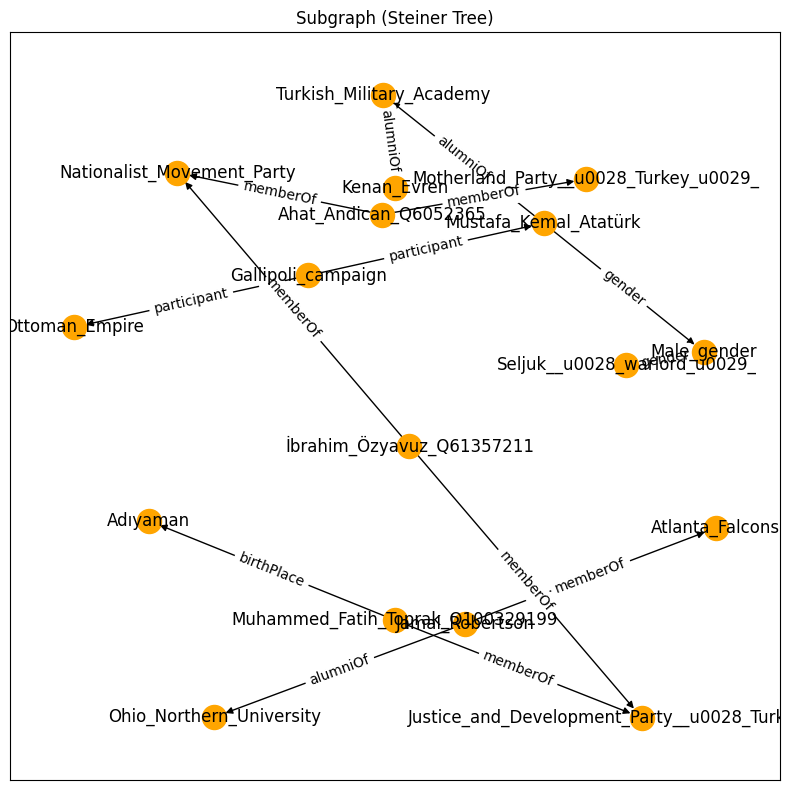

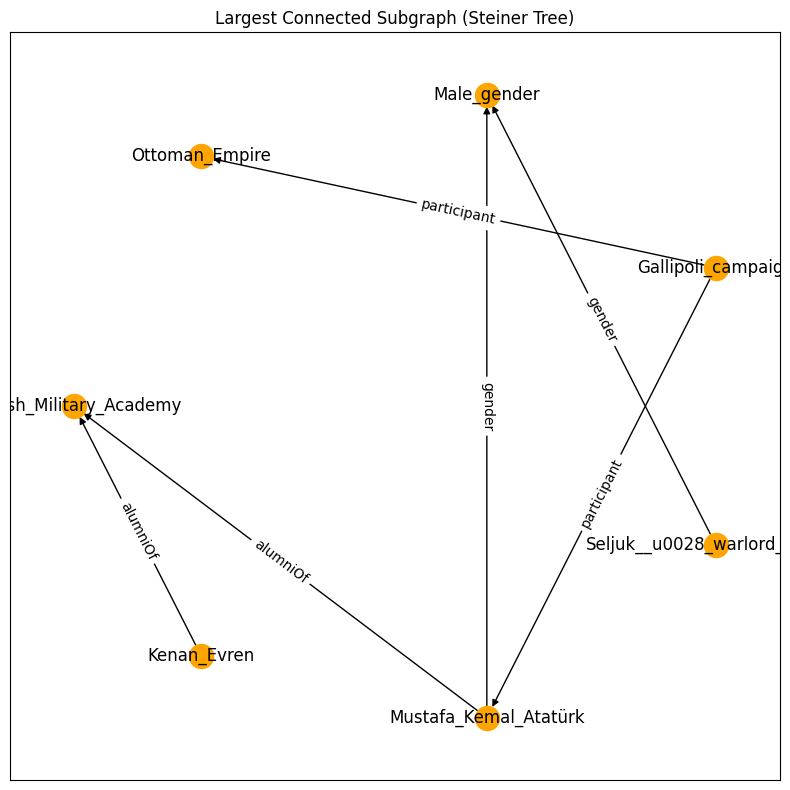


_START_ARTICLE_
Şerefli, Adıyaman
_START_SECTION_
Geography
_START_PARAGRAPH_
Akdag mountain, which is within Toros mountain systems, stretches from southwest to north around Şerefli village. Land forms are rippled degrassively from Sarikaya Tor located on the north to the agricultural planes on the south. Almost each height and valley has a name attributed by local dwellers. The hill which is located on the north east (coordinates 37.805089, 38.088731) is known as 'Kulluk Tepe' (kulluk is a local hat worn by females), the fertile valley located on the southeast is known as ''Cavurd'' (Coordinates 37°47'45.2"N 38°05'24.7"E),  agricultural plantations on the north is known as ''Kayanin Onu'' (37°48'39.3"N 38°04'43.5"E), flat fields located on the south are known as ''Duz'' (37°48'00.6"N 38°04'47.9"E). There are also allegorical place names named after local historical figures such as Mışo'nun Cukuru.
_START_SECTION_
Vegetation
_START_PARAGRAPH_
Oak trees are sporadically existent at re

In [57]:
# Assuming 'H' is your graph
plot_graph_with_simplified_labels(H, title="Subgraph (Steiner Tree)")
H1 = largest_connected_subgraph(H)
plot_graph_with_simplified_labels(H1, title="Largest Connected Subgraph (Steiner Tree)")
print(data[QID]['text'])

In [60]:
edges_to_triples(H)

[('http://yago-knowledge.org/resource/Jamal_Robertson',
  'http://schema.org/memberOf',
  'http://yago-knowledge.org/resource/Atlanta_Falcons'),
 ('http://yago-knowledge.org/resource/Jamal_Robertson',
  'http://schema.org/alumniOf',
  'http://yago-knowledge.org/resource/Ohio_Northern_University'),
 ('http://yago-knowledge.org/resource/Mustafa_Kemal_Atatürk',
  'http://schema.org/alumniOf',
  'http://yago-knowledge.org/resource/Turkish_Military_Academy'),
 ('http://yago-knowledge.org/resource/Mustafa_Kemal_Atatürk',
  'http://schema.org/gender',
  'http://yago-knowledge.org/resource/Male_gender'),
 ('http://yago-knowledge.org/resource/Kenan_Evren',
  'http://schema.org/alumniOf',
  'http://yago-knowledge.org/resource/Turkish_Military_Academy'),
 ('http://yago-knowledge.org/resource/Muhammed_Fatih_Toprak_Q100329199',
  'http://schema.org/memberOf',
  'http://yago-knowledge.org/resource/Justice_and_Development_Party__u0028_Turkey_u0029_'),
 ('http://yago-knowledge.org/resource/Muhammed_Fa

In [44]:
H.edges(data=True)

OutEdgeDataView([('http://yago-knowledge.org/resource/Evgeni_Paladiev', 'http://yago-knowledge.org/resource/Oskemen', {'relation': 'http://schema.org/birthPlace'}), ('http://yago-knowledge.org/resource/Evgeni_Paladiev', 'http://yago-knowledge.org/resource/HC_Spartak_Moscow', {'relation': 'http://schema.org/memberOf'}), ('http://yago-knowledge.org/resource/Ariadna_Chasovnikova', 'http://yago-knowledge.org/resource/Oskemen', {'relation': 'http://schema.org/birthPlace'}), ('http://yago-knowledge.org/resource/Ariadna_Chasovnikova', 'http://yago-knowledge.org/resource/Kazakh_Soviet_Socialist_Republic', {'relation': 'http://schema.org/worksFor'})])

In [42]:
nodes_to_triples(H)

[]

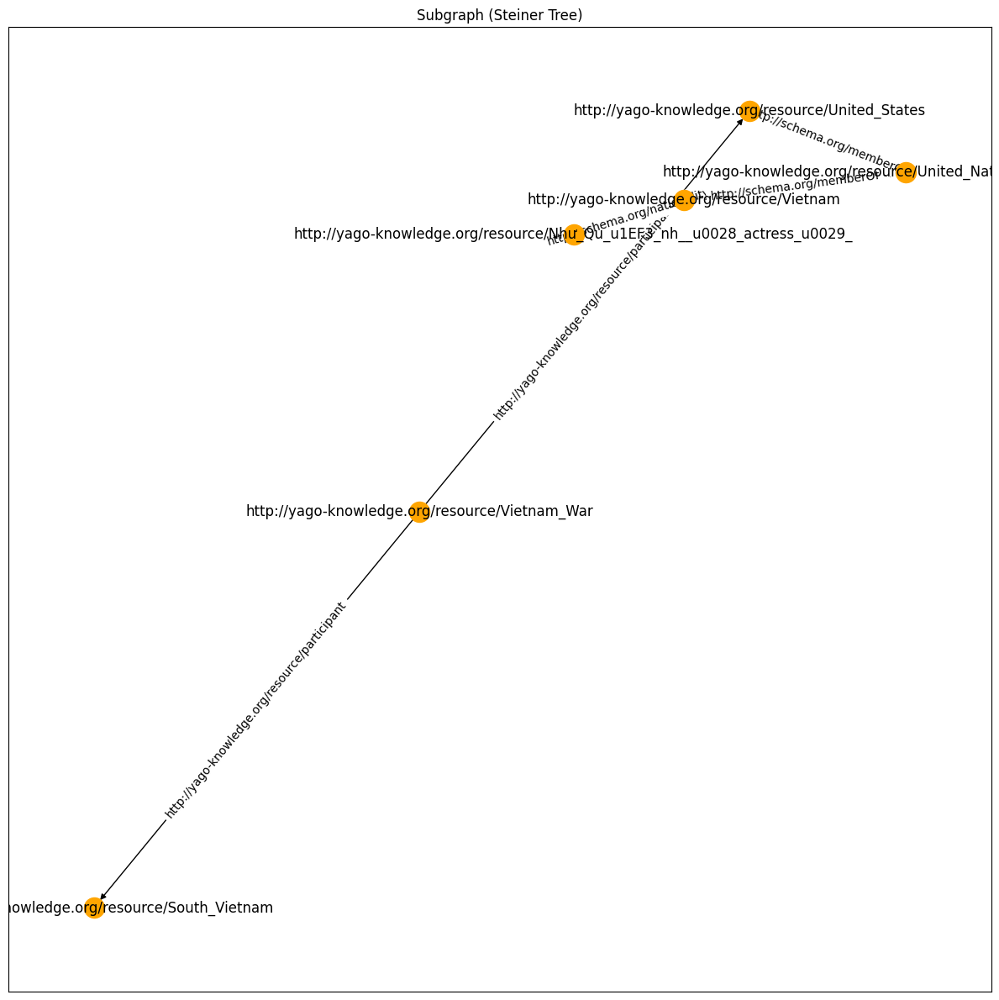


_START_ARTICLE_
Đông Hà
_START_SECTION_
Vietnam War
_START_PARAGRAPH_
During the Vietnam War, Đông Hà was the northernmost town in South Vietnam and was the location of a strategically important United States Marine Corps Đông Hà Combat Base, to support Marine positions along the Vietnamese Demilitarized Zone (DMZ).  The 3rd Marine Division had overall command and control of this operational area.  Large numbers of NVA operated in the DMZ area. 3rd Marine Division intelligence estimated the combat strength of NVA and VC forces in the DMZ area in January 1968 was 40,943 troops. Đông Hà was overrun on March 31, 1972, during the initial assaults of the North Vietnamese Easter Offensive._NEWLINE_Tourists come to Đông Hà nowadays, especially ex-servicemen from the U.S. and Vietnam, who nearly always include a DMZ tour in their programs. The contemporary Vietnamese singer Như Quỳnh was born in Đông Hà in 1970.


In [34]:
plt.figure(figsize=(12, 12))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
# pos_sub = nx.circular_layout(H)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'relation')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Steiner Tree)")
plt.tight_layout()
plt.show()

print(data[QID]['text'])

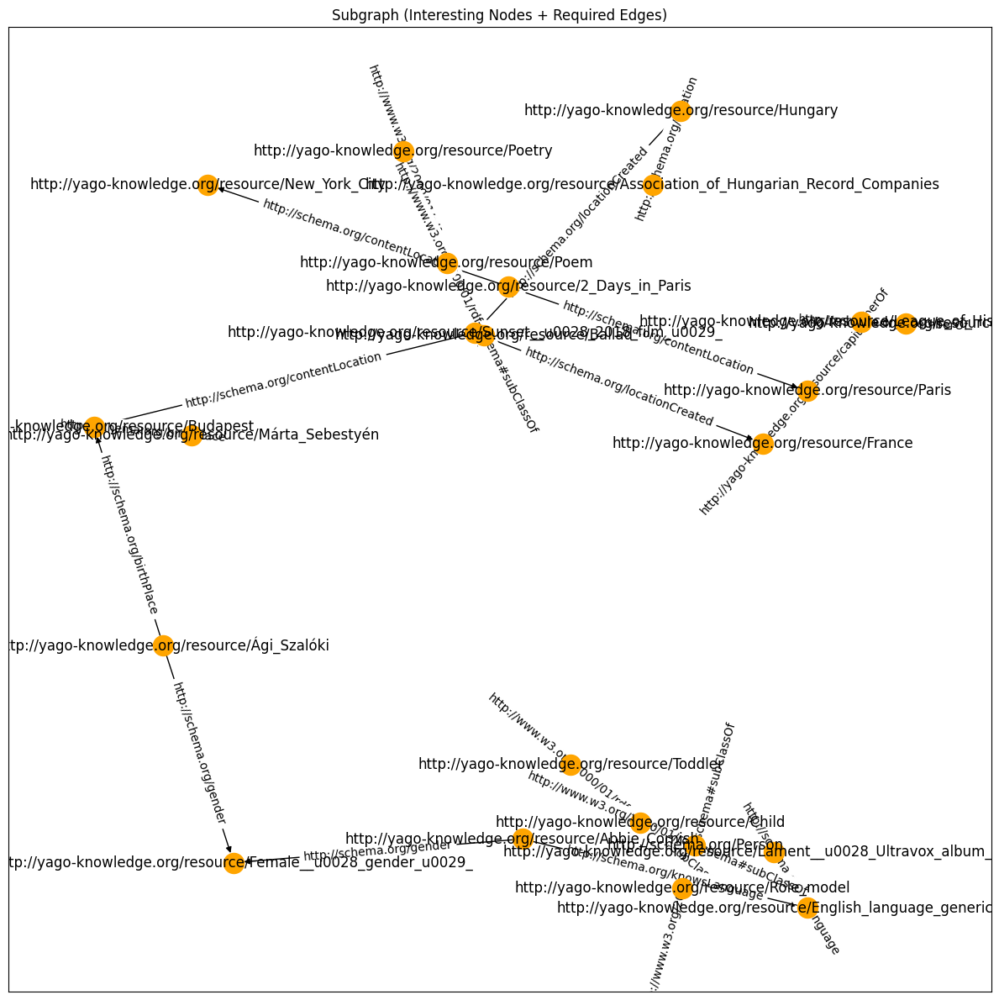


_START_ARTICLE_
Ági Szalóki
_START_SECTION_
Life
_START_PARAGRAPH_
She started singing as a toddler, considering Márta Sebestyén a role model. Her musical background is traditional folk music; she first won recognition for singing with Ökrös in a traditional folk style, and Besh o droM, a Balkan gypsy brass band. With these ensembles she toured around the world from the Montreal Jazz Festival, through Glastonbury Festival to the Théatre de la Ville in Paris, from New York to Beijing._NEWLINE_Since 2005, she began to pursue her solo career and explore various genres, such as jazz, thirties ballads, or children's songs._NEWLINE_Until now, three of her six released albums were awarded Album of the Year Prize (MAHASZ Fonogram Award) in the children's records and jazz categories._NEWLINE_"When I sing it's not important whether it's jazz or traditional music or music of any other kind", Szalóki has said. "I feel as if I'm swimming in the music. The music is like water; or air and I fly in i

In [9]:
plt.figure(figsize=(12, 12))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
# pos_sub = nx.circular_layout(H)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'relation')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

print(data[QID]['text'])

In [10]:
len(H.nodes())

23

In [6]:
idx = 8
keys = list(data.keys())
QID = keys[idx]
data[QID]['entities']

[{'id': 11199,
  'label': '_',
  'description': 'a character that originally appeared on the typewriter and was primarily used to underline words',
  'span': '_',
  'url': 'https://www.wikidata.org/wiki/Q11199'},
 {'id': 244615,
  'label': "Conway's Game of Life",
  'description': '2D cellular automaton devised by J. H. Conway in 1970: cells, arranged in a square grid, are either alive or dead; a live cell with 2 or 3 live neighbors survives; a dead cell with 3 live neighbors becomes alive; otherwise the cell dies/stays dead',
  'span': 'Life',
  'url': 'https://www.wikidata.org/wiki/Q244615'},
 {'id': 1711783,
  'label': 'Muhtar',
  'description': 'elected village head in villages of Turkey',
  'span': 'Muhtar',
  'url': 'https://www.wikidata.org/wiki/Q1711783'},
 {'id': 830887,
  'label': 'Beta Leporis',
  'description': 'star in the constellation Lepus',
  'span': 'Nihal',
  'url': 'https://www.wikidata.org/wiki/Q830887'},
 {'id': 6088854,
  'label': 'İstanbul',
  'description': 'el

In [7]:
yagoID = convert_QID_yagoID(QID)
yagoID

'http://yago-knowledge.org/resource/İnci_Asena'

In [8]:
qids = extract_ids_with_prefix(data[QID]['entities'])
print(len(qids))
qids = qids + [QID]
qids = list(set(qids))
print(len(qids))
yago_ids = parallel_convert_QID_yagoID(qids)
print(len(yago_ids))

32
33
33


In [9]:
yago_ids_list = list(yago_ids.values())
#remove all NA values
yago_ids_list = [x for x in yago_ids_list if x != 'NA']

print(len(yago_ids_list))
yago_ids_list

25


['http://yago-knowledge.org/resource/Publisher',
 'http://yago-knowledge.org/resource/PEN_International',
 'http://yago-knowledge.org/resource/Marriage',
 'http://yago-knowledge.org/resource/English_language',
 'http://yago-knowledge.org/resource/Ani',
 'http://yago-knowledge.org/resource/Childbirth',
 'http://yago-knowledge.org/resource/Duygu_Asena',
 'http://yago-knowledge.org/resource/Istanbul__u0028_electoral_districts_u0029_',
 'http://yago-knowledge.org/resource/Muhtar__u0028_title_u0029_',
 'http://yago-knowledge.org/resource/Birmingham_City_University_School_of_English',
 'http://yago-knowledge.org/resource/Magazine',
 'http://yago-knowledge.org/resource/Beta_Leporis',
 'http://yago-knowledge.org/resource/Journalist',
 'http://yago-knowledge.org/resource/MDMA',
 'http://yago-knowledge.org/resource/İnci_Asena',
 'http://yago-knowledge.org/resource/Nun',
 'http://yago-knowledge.org/resource/Competition',
 'http://yago-knowledge.org/resource/Poem',
 'http://yago-knowledge.org/reso

In [10]:

results = parallel_process_nodes(yago_ids_list)
comb_list = combine_lists_from_dict(results)

print(len(comb_list))


10460


In [26]:
import urllib.parse
from typing import List
import requests

def query_kg_endpoint(yago_endpoint_url: str, query_sparql: str) -> List[str]:
    headers = {
        "Content-Type": "application/sparql-query; charset=utf-8",
        "Accept": "application/sparql-results+json",
    }

    try:
        # Encode query explicitly as UTF-8 bytes
        response = requests.post(yago_endpoint_url, headers=headers, data=query_sparql.encode("utf-8"))

        # Debugging: log the status code and response
        print(f"Response Status Code: {response.status_code}")
        print(f"Response Content: {response.text}")

        if response.status_code == 200:
            return response.json()
        else:
            return None
    except Exception as e:
        print(f"Error querying the YAGO knowledge graph: {e}")
        return None

In [27]:
qr = '''
PREFIX schema: <http://schema.org/>
PREFIX yago: <http://yago-knowledge.org/resource/>
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>

SELECT DISTINCT ?sub ?pred ?obj WHERE {
    {
        yago:İnci_Asena ?pred ?obj .
    }
    UNION
    {
        ?sub ?pred yago:İnci_Asena .
    }
    FILTER (?pred NOT IN (schema:image, schema:about, rdfs:comment, schema:gtin, schema:url, rdfs:label, schema:postalCode, schema:isbn, schema:sameAs, schema:mainEntityOfPage, schema:leiCode, rdf:type, schema:dateCreated, yago:unemploymentRate, yago:length, schema:description, yago:iswcCode, schema:iataCode, schema:logo, schema:alternateName, schema:geo, rdfs:subclassOf, schema:icaoCode, yago:humanDevelopmentIndex, owl:sameAs, schema:dateCreated, schema:startDate, schema:endDate, yago:follows, schema:superEvent))
}
LIMIT 10000
'''

In [28]:
query_kg_endpoint(yago_endpoint_url, qr)

Response Status Code: 200
Response Content: {
  "head" : {
    "vars" : [ "sub", "pred", "obj" ]
  },
  "results" : {
    "bindings" : [ {
      "pred" : {
        "type" : "uri",
        "value" : "http://schema.org/alumniOf"
      },
      "obj" : {
        "type" : "uri",
        "value" : "http://yago-knowledge.org/resource/Istanbul_University"
      }
    }, {
      "pred" : {
        "type" : "uri",
        "value" : "http://schema.org/birthDate"
      },
      "obj" : {
        "datatype" : "http://www.w3.org/2001/XMLSchema#dateTime",
        "type" : "literal",
        "value" : "1948-01-01T00:00:00.000Z"
      }
    }, {
      "pred" : {
        "type" : "uri",
        "value" : "http://schema.org/birthPlace"
      },
      "obj" : {
        "type" : "uri",
        "value" : "http://yago-knowledge.org/resource/Istanbul"
      }
    }, {
      "pred" : {
        "type" : "uri",
        "value" : "http://schema.org/gender"
      },
      "obj" : {
        "type" : "uri",
       

{'head': {'vars': ['sub', 'pred', 'obj']},
 'results': {'bindings': [{'pred': {'type': 'uri',
     'value': 'http://schema.org/alumniOf'},
    'obj': {'type': 'uri',
     'value': 'http://yago-knowledge.org/resource/Istanbul_University'}},
   {'pred': {'type': 'uri', 'value': 'http://schema.org/birthDate'},
    'obj': {'datatype': 'http://www.w3.org/2001/XMLSchema#dateTime',
     'type': 'literal',
     'value': '1948-01-01T00:00:00.000Z'}},
   {'pred': {'type': 'uri', 'value': 'http://schema.org/birthPlace'},
    'obj': {'type': 'uri',
     'value': 'http://yago-knowledge.org/resource/Istanbul'}},
   {'pred': {'type': 'uri', 'value': 'http://schema.org/gender'},
    'obj': {'type': 'uri',
     'value': 'http://yago-knowledge.org/resource/Female__u0028_gender_u0029_'}},
   {'pred': {'type': 'uri', 'value': 'http://schema.org/knowsLanguage'},
    'obj': {'type': 'uri',
     'value': 'http://yago-knowledge.org/resource/Turkish_language_generic_instance'}},
   {'pred': {'type': 'uri', 'va

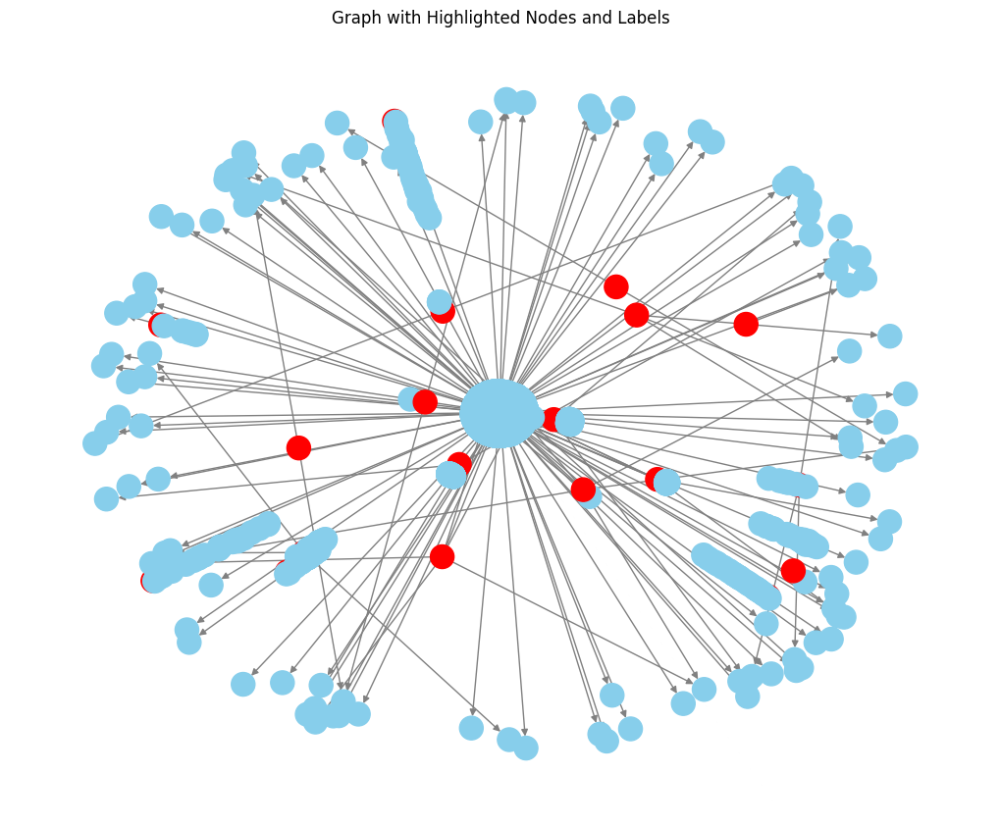

In [8]:
import networkx as nx

In [19]:
import networkx as nx
from networkx.algorithms.approximation import steiner_tree

def build_minimal_subgraph_directed_remove_isolated_with_predicates(
    G: nx.DiGraph, 
    interesting_nodes
) -> nx.DiGraph:
    """
    1) Use an approximate Steiner Tree in an undirected view of G
       to get minimal coverage of the interesting nodes.
    2) Re-apply direction from G to that subgraph, including
       original edge attributes such as "predicate".
    3) Remove isolated non-interesting nodes.
    4) Always keep interesting nodes.
    
    :param G: Original directed graph (nx.DiGraph) with possible attributes (e.g. "predicate").
    :param interesting_nodes: Collection of terminal (interesting) nodes.
    :return: Directed subgraph containing:
             - all interesting nodes 
             - the minimal set of intermediate nodes 
             - edges (with original predicates) that are necessary for connectivity.
    """
    # Step 1: Filter out invalid interesting nodes
    valid_interesting = [n for n in interesting_nodes if n in G]
    
    print(f'Valid interesting nodes: {valid_interesting}')
    print(f'Interesting nodes: {interesting_nodes}')
    #print removed nodes
    print(f'Removing nodes as they are not in the graph: {[n for n in interesting_nodes if n not in G]}')
    if not valid_interesting:
        # No valid interesting nodes => Return empty subgraph
        return nx.DiGraph()

    # Step 2: Convert G to an undirected graph (for Steiner Tree)
    G_und = G.to_undirected(as_view=False)

    # Step 3: Compute the Steiner Tree subgraph (UNDIRECTED)
    steiner_subgraph_und = steiner_tree(G_und, valid_interesting)

    # Step 4: Build a directed subgraph from the Steiner Tree
    #    We'll add all nodes from the Steiner subgraph
    H = nx.DiGraph()
    H.add_nodes_from(steiner_subgraph_und.nodes())
    
    # Step 5: Ensure all interesting nodes are present (even if disconnected)
    for node in valid_interesting:
        if node not in H:
            H.add_node(node)

    # For each undirected edge (u, v) in the Steiner subgraph:
    #  - check if G has (u->v), and if so, copy that edge + attributes
    #  - check if G has (v->u), and if so, copy that edge + attributes
    for (u, v) in steiner_subgraph_und.edges():
        # print(f'u = {u}, v = {v}')
        if G.has_edge(u, v):
            print(G[u][v])
            # Copy **all** attributes from the original graph edge
            # (including "predicate" if it exists)
            H.add_edge(u, v, **G[u][v])

        if G.has_edge(v, u):
            # Copy **all** attributes from the original graph edge
            H.add_edge(v, u, **G[v][u])

    

    # Step 6: Remove isolated non-interesting nodes
    #    i.e., any node with in_degree=0 and out_degree=0, unless it's interesting
    isolated_nodes_to_remove = []
    for node in H.nodes():
        if H.in_degree(node) == 0 and H.out_degree(node) == 0:
            isolated_nodes_to_remove.append(node)
    print(f'Removing nodes as they are isolated: {isolated_nodes_to_remove}')
    H.remove_nodes_from(isolated_nodes_to_remove)

    return H


In [21]:
G_und = graph.to_undirected(as_view=False)

valid_interesting = [n for n in yago_ids_list if n in graph]

# Step 3: Compute the Steiner Tree subgraph (UNDIRECTED)
steiner_subgraph_und = steiner_tree(G_und, valid_interesting)

# Step 4: Build a directed subgraph from the Steiner Tree
#    We'll add all nodes from the Steiner subgraph
H = nx.DiGraph()
H.add_nodes_from(steiner_subgraph_und.nodes())


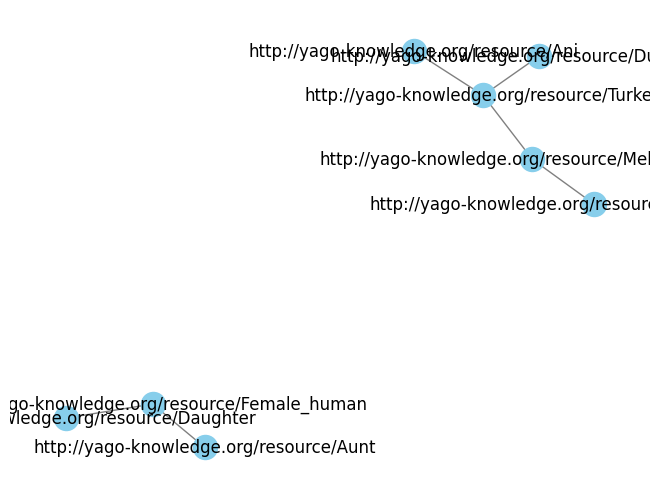

In [22]:
nx.draw(steiner_subgraph_und, with_labels=True, node_color="skyblue", edge_color="gray")

In [75]:
list(steiner_subgraph_und.edges())[0][0]

'http://yago-knowledge.org/resource/Đông_Hà'

In [76]:
graph[list(steiner_subgraph_und.edges())[0][0]][list(steiner_subgraph_und.edges())[0][1]]

{'predicate': 'http://schema.org/location'}

In [38]:
comb_list

[('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Hrithik_Roshan'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Ashutosh_Rana'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Dipannita_Sharma'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Tiger_Shroff'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Anupriya_Goenka'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Vaani_Kapoor'),
 ('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
  'http://schema

In [70]:
yago_ids_list = [element for element in yago_ids_list if element.startswith("http://yago-knowledge.org/")]

In [18]:
len(yago_ids_list)

25

In [19]:
yago_ids_list

['http://yago-knowledge.org/resource/İnci_Asena',
 'http://yago-knowledge.org/resource/Childbirth',
 'http://yago-knowledge.org/resource/Competition',
 'http://yago-knowledge.org/resource/Istanbul__u0028_electoral_districts_u0029_',
 'http://yago-knowledge.org/resource/Magazine',
 'http://yago-knowledge.org/resource/Journalist',
 'http://yago-knowledge.org/resource/Birmingham_City_University_School_of_English',
 'http://yago-knowledge.org/resource/MDMA',
 'http://yago-knowledge.org/resource/Aunt',
 'http://yago-knowledge.org/resource/Daughter',
 'http://yago-knowledge.org/resource/English_language',
 'http://yago-knowledge.org/resource/Adam_Sanat',
 'http://yago-knowledge.org/resource/Poem',
 'http://yago-knowledge.org/resource/Marriage',
 'http://yago-knowledge.org/resource/Duygu_Asena',
 'http://yago-knowledge.org/resource/Beauty_pageant',
 'http://yago-knowledge.org/resource/Ani',
 'http://yago-knowledge.org/resource/Conway_u0027_s_Game_of_Life',
 'http://yago-knowledge.org/resource

In [20]:
H = build_minimal_subgraph_directed(graph, yago_ids_list)

NameError: name 'build_minimal_subgraph_directed' is not defined

In [21]:
H =build_minimal_subgraph_directed_remove_isolated_with_predicates(graph, yago_ids_list)

Valid interesting nodes: ['http://yago-knowledge.org/resource/Publisher', 'http://yago-knowledge.org/resource/PEN_International', 'http://yago-knowledge.org/resource/Marriage', 'http://yago-knowledge.org/resource/English_language', 'http://yago-knowledge.org/resource/Ani', 'http://yago-knowledge.org/resource/Childbirth', 'http://yago-knowledge.org/resource/Duygu_Asena', 'http://yago-knowledge.org/resource/Muhtar__u0028_title_u0029_', 'http://yago-knowledge.org/resource/Birmingham_City_University_School_of_English', 'http://yago-knowledge.org/resource/Magazine', 'http://yago-knowledge.org/resource/Beta_Leporis', 'http://yago-knowledge.org/resource/Journalist', 'http://yago-knowledge.org/resource/MDMA', 'http://yago-knowledge.org/resource/İnci_Asena', 'http://yago-knowledge.org/resource/Nun', 'http://yago-knowledge.org/resource/Competition', 'http://yago-knowledge.org/resource/Poem', 'http://yago-knowledge.org/resource/Turkey', 'http://yago-knowledge.org/resource/Beauty_pageant', 'http:/

In [24]:
H =build_minimal_subgraph_directed_remove_isolated_with_predicates(graph, yago_ids_list)

{'relation': 'http://schema.org/nationality'}
{'relation': 'http://schema.org/memberOf'}
{'relation': 'http://schema.org/nationality'}
{'relation': 'http://schema.org/nationality'}
{'relation': 'http://schema.org/location'}


In [13]:
H =build_minimal_subgraph_directed_remove_isolated_with_predicates(graph, yago_ids_list)

{'relation': 'http://www.w3.org/2000/01/rdf-schema#subClassOf'}
{'relation': 'http://www.w3.org/2000/01/rdf-schema#subClassOf'}
Removing nodes as they are isolated: ['http://yago-knowledge.org/resource/MDMA', 'http://yago-knowledge.org/resource/Journalist', 'http://yago-knowledge.org/resource/Magazine', 'http://yago-knowledge.org/resource/Nun', 'http://yago-knowledge.org/resource/Beauty_pageant', 'http://yago-knowledge.org/resource/English_language', 'http://yago-knowledge.org/resource/Birmingham_City_University_School_of_English', 'http://yago-knowledge.org/resource/Beta_Leporis', 'http://yago-knowledge.org/resource/Model_sheet', 'http://yago-knowledge.org/resource/Competition', 'http://yago-knowledge.org/resource/Poem', 'http://yago-knowledge.org/resource/Publisher', 'http://yago-knowledge.org/resource/Marriage', 'http://yago-knowledge.org/resource/Muhtar__u0028_title_u0029_', 'http://yago-knowledge.org/resource/Childbirth']


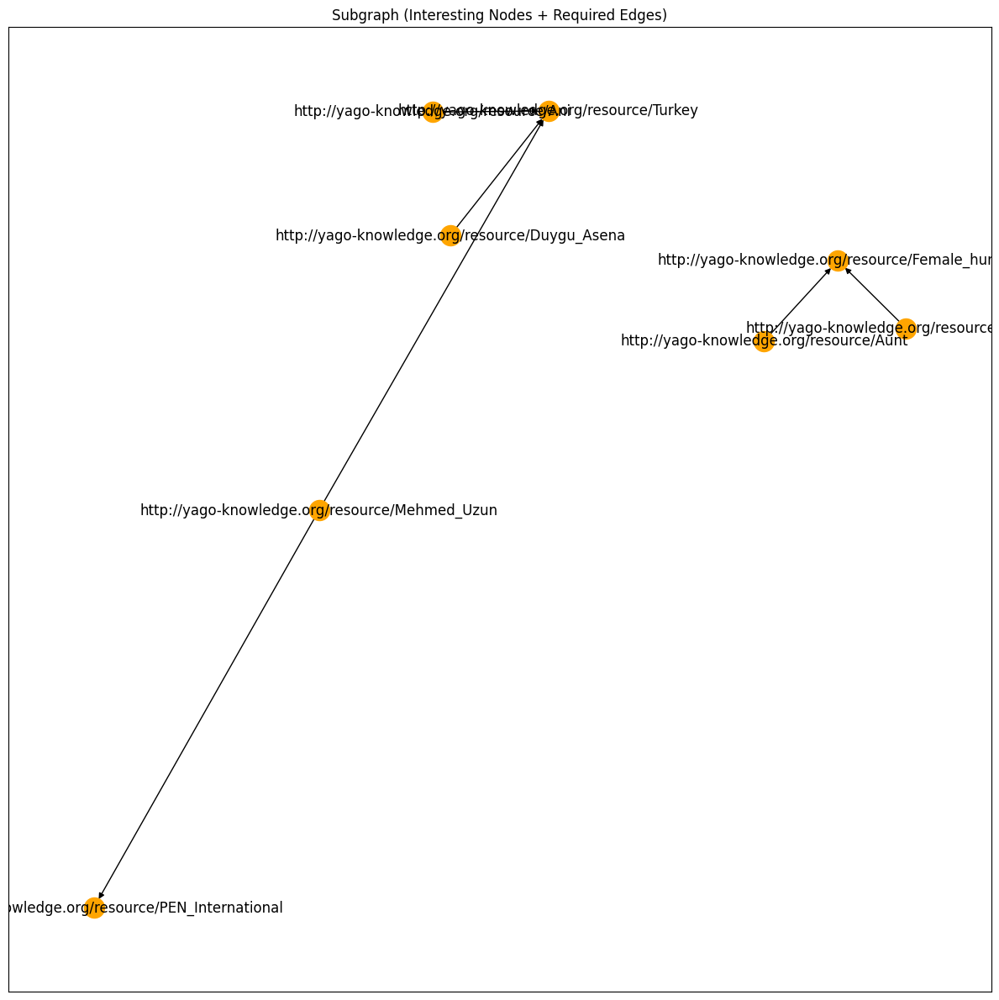

In [14]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(12, 12))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'predicate')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

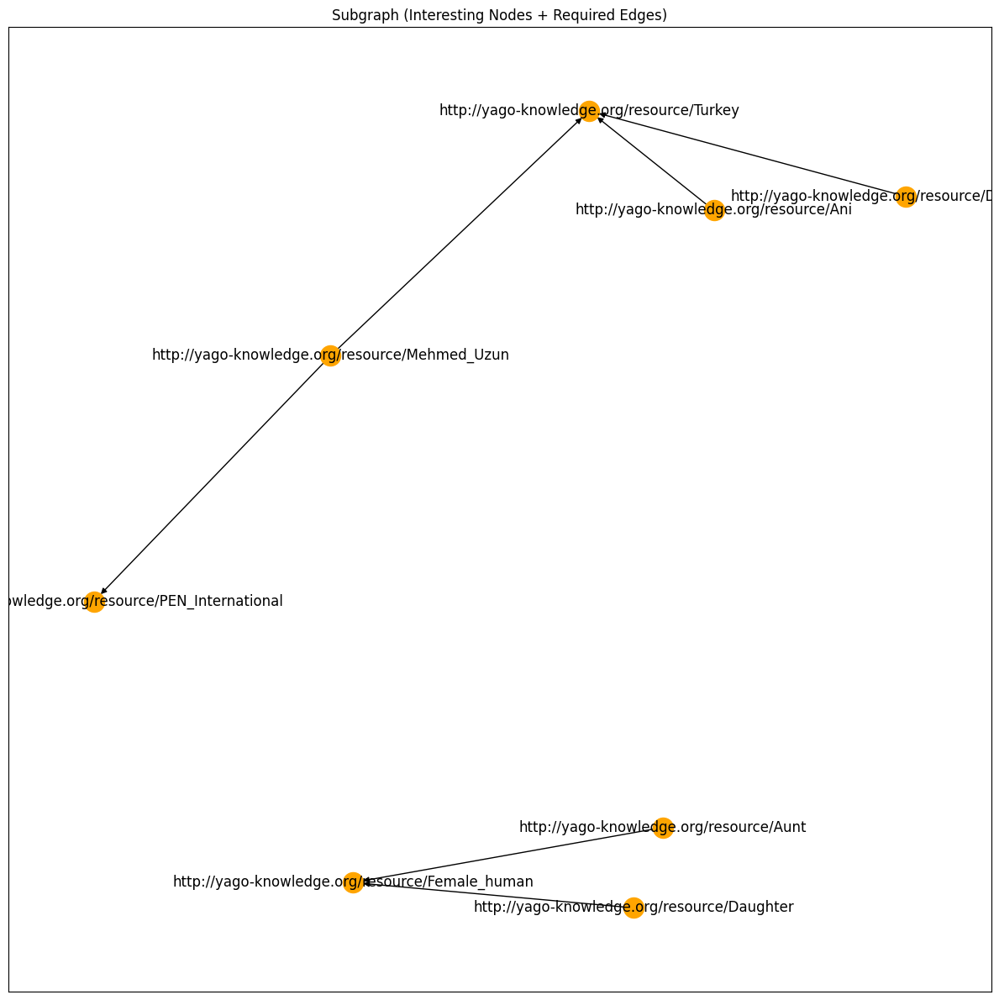

In [16]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(12, 12))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'predicate')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

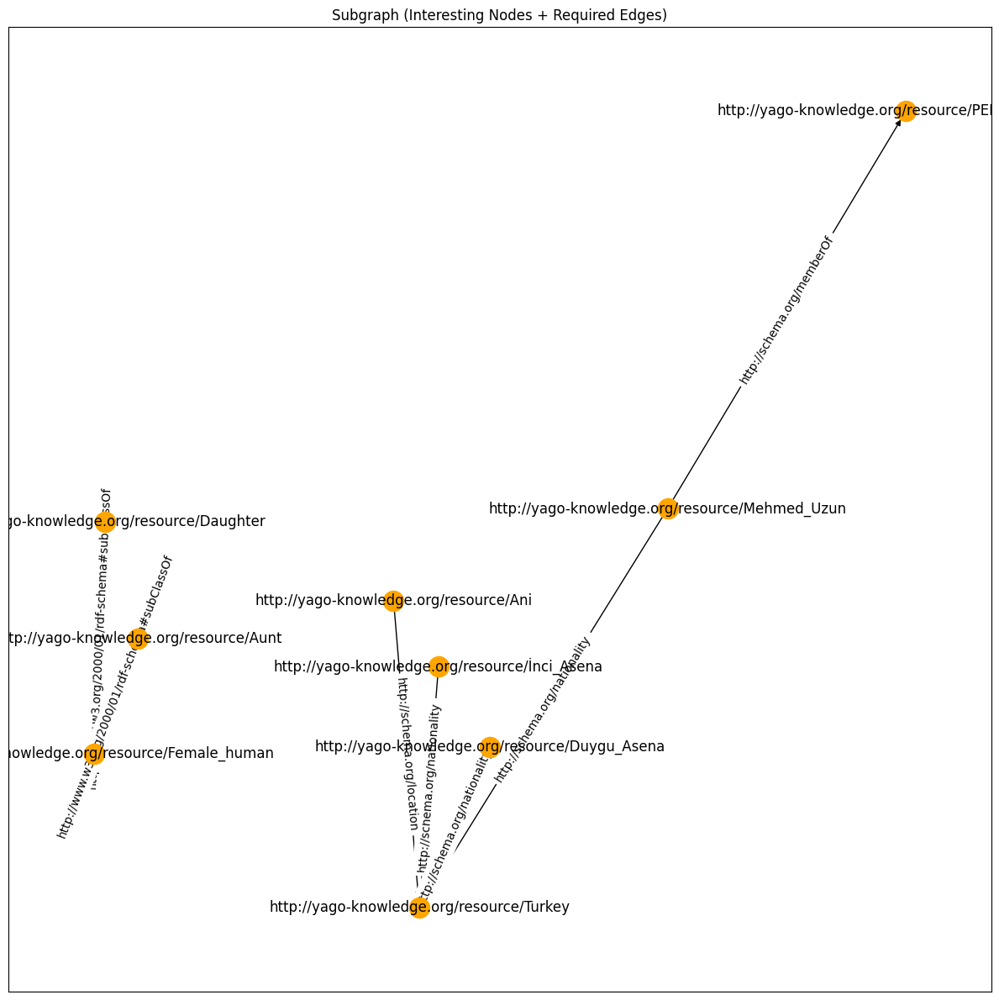

In [22]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(12, 12))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'relation')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

In [28]:
print(data[QID]['text'])
print(yago_ids_list)


_START_ARTICLE_
İnci Asena
_START_SECTION_
Life
_START_PARAGRAPH_
She was born to Muhtar and Nihal in İstanbul, Turkey in 1948. She is the younger sister of Duygu Asena, a notable journalist. She graduated from the School of English studies at İstanbul University._NEWLINE_In 1966, she participated at the Miss Turkey beauty contest under the pseudonym Aylin Öndersev, which actually was her aunt's name, who died young. She won the contest. She married to journalist Halit Çapın, and gave birth to a daughter named Berfu. Her marriage ended with divorce lasting briefly.
_START_SECTION_
Literature career
_START_PARAGRAPH_
In 1990, she established a publishing company named Adam Yayınları. Her poems appeared in Adam Sanat, a literary periodical of the company. In some of her poems, she used the pen name Ani Toros. She also wrote books, and is a member of PEN International.
['http://yago-knowledge.org/resource/Publisher', 'http://yago-knowledge.org/resource/PEN_International', 'http://yago-kn

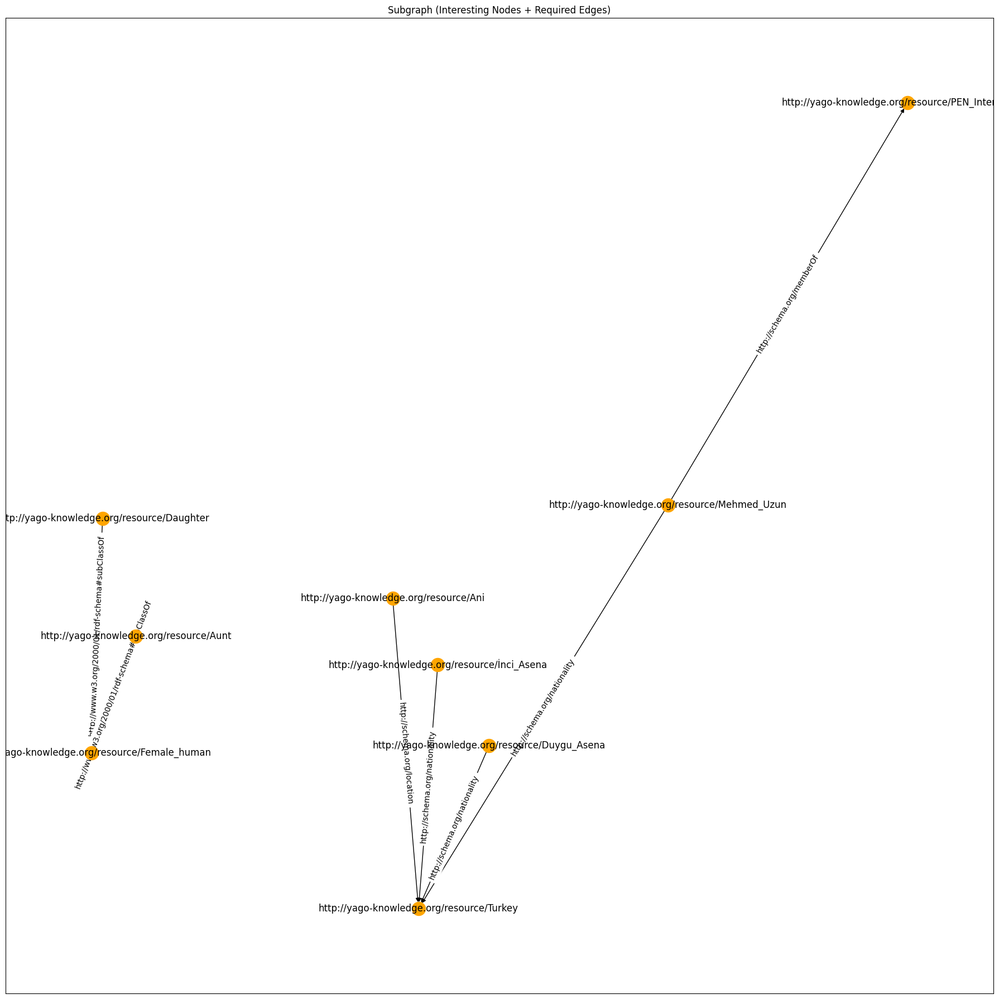

In [25]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(18, 18))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'relation')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

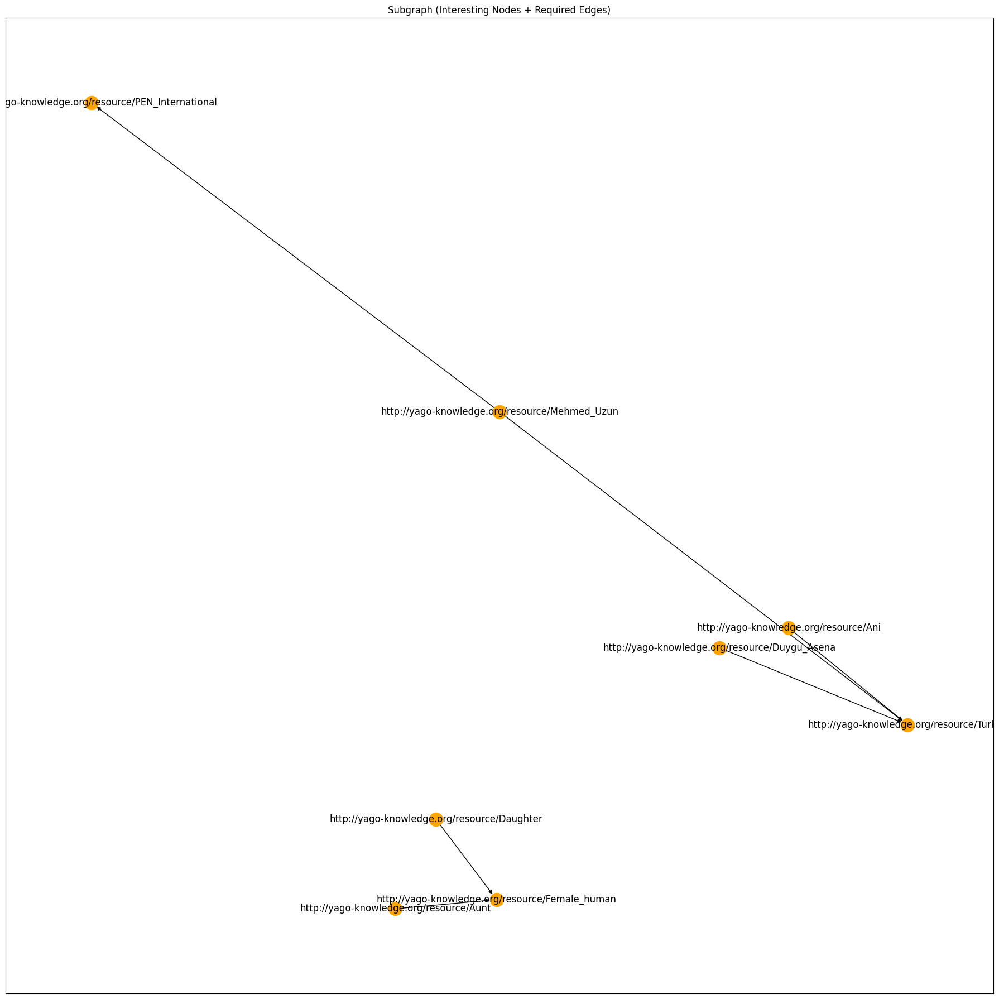

In [101]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(18, 18))

# Example: Layout and draw
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)

# Draw edge labels (assuming the edge attribute is named "relation")
edge_labels = nx.get_edge_attributes(H, 'predicate')
nx.draw_networkx_edge_labels(H, pos_sub, edge_labels=edge_labels)

plt.title("Subgraph (Interesting Nodes + Required Edges)")
plt.tight_layout()
plt.show()

In [99]:
H.nodes()

NodeView(('http://yago-knowledge.org/resource/Ani', 'http://yago-knowledge.org/resource/Mehmed_Uzun', 'http://yago-knowledge.org/resource/Aunt', 'http://yago-knowledge.org/resource/Duygu_Asena', 'http://yago-knowledge.org/resource/Daughter', 'http://yago-knowledge.org/resource/PEN_International', 'http://yago-knowledge.org/resource/Turkey', 'http://yago-knowledge.org/resource/Female_human'))

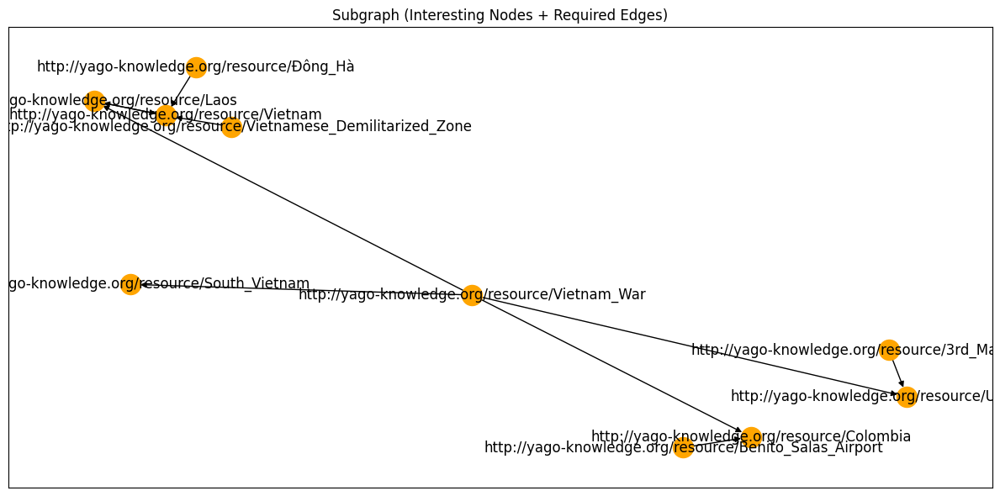

In [85]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(12, 6))

# You can reuse pos_orig to show how the subgraph looks in the same layout,
# or generate a new layout specifically for H:
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)
plt.title("Subgraph (Interesting Nodes + Required Edges)")

plt.tight_layout()
plt.show()

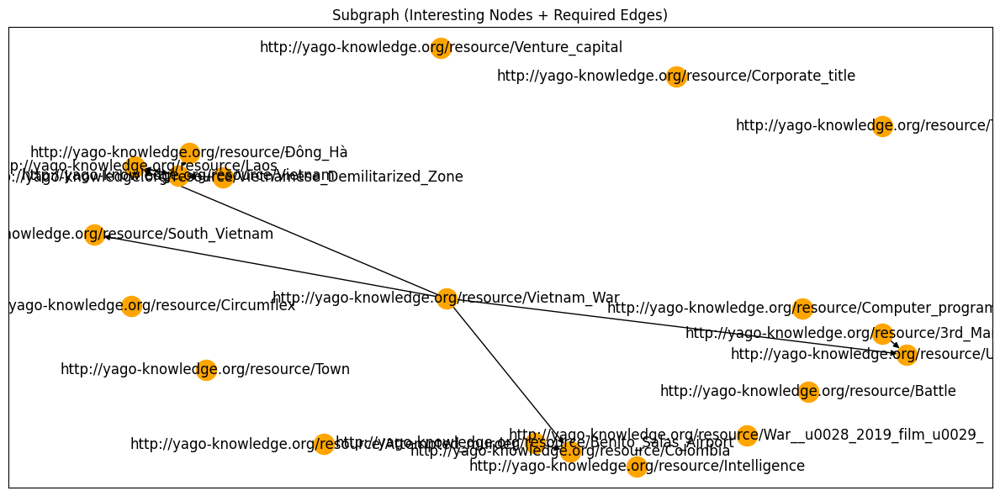

In [25]:
# 4. Plot the original graph and the subgraph side by side
plt.figure(figsize=(12, 6))

# You can reuse pos_orig to show how the subgraph looks in the same layout,
# or generate a new layout specifically for H:
pos_sub = nx.spring_layout(H, seed=42)
nx.draw_networkx(H, pos=pos_sub, node_color="orange", with_labels=True)
plt.title("Subgraph (Interesting Nodes + Required Edges)")

plt.tight_layout()
plt.show()

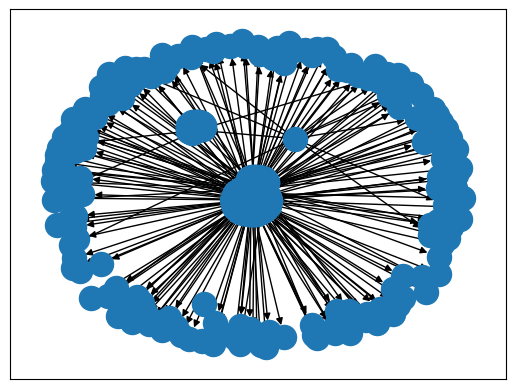

In [51]:
nx.draw_networkx(graph, with_labels=False)

In [54]:
triples = []
for source, target, data in graph.edges(data=True):
    # The 'relation' attribute is our predicate, if it exists
    relation = data.get('relation', 'unknown_relation')
    triples.append((source, relation, target))

In [58]:
with open("interesting_nodes.txt", "w") as f:
    for value in yago_ids_list:
        f.write(str(value) + "\n")

In [24]:
len(H.nodes())

20

In [43]:
len(set(list(yago_ids_list)))

21

In [38]:
len(graph.nodes())

983

In [41]:
H.nodes()

NodeView(('http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_', 'http://yago-knowledge.org/resource/Vietnam_War', 'http://yago-knowledge.org/resource/South_Vietnam', 'http://yago-knowledge.org/resource/Benito_Salas_Airport', 'http://yago-knowledge.org/resource/United_States', 'http://yago-knowledge.org/resource/Vietnam'))

In [38]:
interesting_nodes

['http://yago-knowledge.org/resource/War__u0028_2019_film_u0029_',
 'http://yago-knowledge.org/resource/Vietnam_War',
 'http://yago-knowledge.org/resource/Đông_Hà',
 'http://yago-knowledge.org/resource/Town',
 'http://yago-knowledge.org/resource/South_Vietnam',
 'http://yago-knowledge.org/resource/Đông_Hà_Combat_Base',
 'http://yago-knowledge.org/resource/Corporate_title',
 'http://yago-knowledge.org/resource/Vietnamese_Demilitarized_Zone',
 'http://yago-knowledge.org/resource/3rd_Marine_Division',
 'http://yago-knowledge.org/resource/Circumflex',
 'http://yago-knowledge.org/resource/Benito_Salas_Airport',
 'http://yago-knowledge.org/resource/Intelligence',
 'http://yago-knowledge.org/resource/Battle',
 'http://yago-knowledge.org/resource/Venture_capital',
 'http://yago-knowledge.org/resource/Troop',
 'http://yago-knowledge.org/resource/Attempted_murder',
 'http://yago-knowledge.org/resource/Easter',
 'http://yago-knowledge.org/resource/United_States',
 'http://yago-knowledge.org/resou

In [13]:
data[QID]['text']

'\n_START_ARTICLE_\nĐông Hà\n_START_SECTION_\nVietnam War\n_START_PARAGRAPH_\nDuring the Vietnam War, Đông Hà was the northernmost town in South Vietnam and was the location of a strategically important United States Marine Corps Đông Hà Combat Base, to support Marine positions along the Vietnamese Demilitarized Zone (DMZ).  The 3rd Marine Division had overall command and control of this operational area.  Large numbers of NVA operated in the DMZ area. 3rd Marine Division intelligence estimated the combat strength of NVA and VC forces in the DMZ area in January 1968 was 40,943 troops. Đông Hà was overrun on March\xa031, 1972, during the initial assaults of the North Vietnamese Easter Offensive._NEWLINE_Tourists come to Đông Hà nowadays, especially ex-servicemen from the U.S. and Vietnam, who nearly always include a DMZ tour in their programs. The contemporary Vietnamese singer Như Quỳnh was born in Đông Hà in 1970.'

In [16]:
candidate_nodes

['Q11199',
 'Q309',
 'Q4550073',
 'Q3050847',
 'Q854323',
 'Q4637492',
 'Q6382533',
 'Q129864',
 'Q336449',
 'Q22424',
 'Q215512',
 'Q148',
 'Q418151',
 'Q2028118',
 'Q44127',
 'Q909239',
 'Q668',
 'Q7401',
 'Q64390886',
 'Q79',
 'Q198',
 'Q168751',
 'Q2573619',
 'Q35794',
 'Q166886',
 'Q2984198',
 'Q16057470',
 'Q150229',
 'Q11471',
 'Q199',
 'Q17252',
 'Q1321905',
 'Q2413618',
 'Q1330167',
 'Q548289',
 'Q578328',
 'Q4670747',
 'Q4724999',
 'Q9458',
 'Q45604',
 'Q889',
 'Q9927',
 'Q180309',
 'Q20707176',
 'Q43115',
 'Q664635',
 'Q142',
 'Q234',
 'Q221',
 'Q899',
 'Q208379',
 'Q2648522',
 'Q214178',
 'Q219060',
 'Q48195',
 'Q222',
 'Q192541',
 'Q5251142',
 'Q1530',
 'Q23031',
 'Q11767',
 'Q193325',
 'Q794',
 'Q21998199',
 'Q27407',
 'Q395433',
 'Q6393794',
 'Q4705897',
 'Q27381',
 'Q4129994',
 'Q22694790',
 'Q1054746',
 'Q1479726',
 'Q8646',
 'Q27231',
 'Q804970',
 'Q233838',
 'Q5002515',
 'Q15252062',
 'Q25209352',
 'Q208097',
 'Q1447582',
 'Q234056',
 'Q6186049',
 'Q465227',
 'Q5816'

In [17]:
results

{0: {'error': 'not found'},
 1: {'error': 'not found'},
 2: [],
 3: {'error': 'not found'},
 4: [('http://yago-knowledge.org/resource/Jats',
   'http://www.w3.org/2000/01/rdf-schema#subClassOf',
   'http://yago-knowledge.org/resource/Punjabis'),
  ('http://yago-knowledge.org/resource/Arain',
   'http://www.w3.org/2000/01/rdf-schema#subClassOf',
   'http://yago-knowledge.org/resource/Punjabis'),
  ('http://yago-knowledge.org/resource/Punjabi_diaspora',
   'http://www.w3.org/2000/01/rdf-schema#subClassOf',
   'http://yago-knowledge.org/resource/Punjabis'),
  ('http://yago-knowledge.org/resource/Punjabis',
   'http://www.w3.org/2000/01/rdf-schema#subClassOf',
   'http://yago-knowledge.org/resource/South_Asians_Q100251275')],
 5: [('http://yago-knowledge.org/resource/40th_Pathans',
   'http://schema.org/location',
   'http://yago-knowledge.org/resource/British_Raj')],
 6: [('http://yago-knowledge.org/resource/Battalion',
   'http://www.w3.org/2000/01/rdf-schema#subClassOf',
   'http://yago

In [ ]:
results

In [18]:
yagoID

'http://yago-knowledge.org/resource/14th_Punjab_Regiment'

In [19]:
data[QID]['entities']

[{'id': 11199,
  'label': '_',
  'description': 'a character that originally appeared on the typewriter and was primarily used to underline words',
  'span': '_',
  'url': 'https://www.wikidata.org/wiki/Q11199'},
 {'id': 309,
  'label': 'history',
  'description': 'past events and their record',
  'span': 'history',
  'url': 'https://www.wikidata.org/wiki/Q309'},
 {'id': 4550073,
  'label': '14th Punjab Regiment',
  'description': '',
  'span': '14th Punjab Regiment',
  'url': 'https://www.wikidata.org/wiki/Q4550073'},
 {'id': 3050847,
  'label': 'consolidation',
  'description': 'merger and acquisition of many smaller companies into much larger ones',
  'span': 'amalgamation',
  'url': 'https://www.wikidata.org/wiki/Q3050847'},
 {'id': 854323,
  'label': 'Punjabi people',
  'description': 'ethnic group',
  'span': 'Punjabis',
  'url': 'https://www.wikidata.org/wiki/Q854323'},
 {'id': 4637492,
  'label': '40th Pathans',
  'description': '',
  'span': '40th Pathans',
  'url': 'https://w

In [10]:
idx = 7
keys = list(data.keys())
QID = keys[idx]
QID = 'Q4550073'

yagoID = convert_QID_yagoID(QID)

print(f'seed node: {QID}')
candidate_nodes = extract_ids_with_prefix(data[QID]['entities'])

results = parallel_process_nodes(candidate_nodes)
comb_list = combine_lists_from_dict(results)

print(len(comb_list))
processed_triples = []
try:
    for i in range(len(comb_list)):
        triple = comb_list[i]
        print(triple)
        predicate = str(triple[1]).lower()
        # print(predicate)
        exclude = False
        for substring in exclude_props:
            if substring.lower() in predicate:
                
                exclude = True
                break
        if exclude:
            print(f'{predicate}, {substring} - excluded')
            continue
        else:
            processed_triples.append(triple)
except Exception as e:
    print(e)
print(len(processed_triples))

seed node: Q4550073
Error converting QID to YagoID
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error: 400
Error: 400
done
done
done
done
done
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
done
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error: 400
done
done
done
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
done
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
done
done
done
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error: 400
done
done
done
done
done
done
Error converting QID to Yago

In [11]:
yagoID

'http://yago-knowledge.org/resource/14th_Punjab_Regiment'

In [12]:
# Create the graph
graph = create_graph_from_triples(processed_triples)

In [13]:
# Print information about the graph
print("Nodes:")
print(graph.nodes())
print("\nEdges:")
print(graph.edges(data=True))

# # Draw the graph without labels
# plt.figure(figsize=(10, 8))
# pos = nx.spring_layout(graph)  # Layout for nodes
# nx.draw(graph, pos, node_size=300, node_color="skyblue", arrowsize=10, edge_color="gray")
# plt.title("Graph without Labels")
# plt.show()

Nodes:
['http://yago-knowledge.org/resource/Indian_Rebellion_of_1857', 'http://yago-knowledge.org/resource/East_India_Company_generic_instance', 'http://yago-knowledge.org/resource/Nana_Saheb_Peshwa_II', 'http://yago-knowledge.org/resource/British_Empire', 'http://yago-knowledge.org/resource/Gwalior_State', 'http://yago-knowledge.org/resource/Oudh_State', 'http://yago-knowledge.org/resource/Kingdom_of_Nepal', 'http://yago-knowledge.org/resource/Dhir_Shumsher_Rana', 'http://yago-knowledge.org/resource/Tulsipur_State', 'http://yago-knowledge.org/resource/Birjis_Qadr', 'http://yago-knowledge.org/resource/Rani_of_Jhansi', 'http://yago-knowledge.org/resource/Kunwar_Singh', 'http://yago-knowledge.org/resource/John_Lawrence_u002C__1st_Baron_Lawrence', 'http://yago-knowledge.org/resource/East_India_Company_College', 'http://yago-knowledge.org/resource/Knight_Grand_Cross_Of_The_Order_Of_The_Bath_Q12177451_generic_instance', '1811-03-04T00:00:00.000Z', 'http://yago-knowledge.org/resource/Richmon

In [14]:
yagoID in graph.nodes()

False

In [27]:
try:
    longest_path = find_longest_path_through_node(graph, yagoID)
    print("Longest Path through node:", longest_path)

    # Visualize only the longest path
    visualize_long_sequence_with_labels(graph, longest_path)
except ValueError as e:
    print(e)

Target node 'http://yago-knowledge.org/resource/14th_Punjab_Regiment' is not in the graph.


Longest Path: ['http://yago-knowledge.org/resource/The_Campaign__u0028_film_u0029_', 'http://yago-knowledge.org/resource/Tzi_Ma', 'http://yago-knowledge.org/resource/Hong_Kong', 'http://yago-knowledge.org/resource/Asian_Development_Bank']


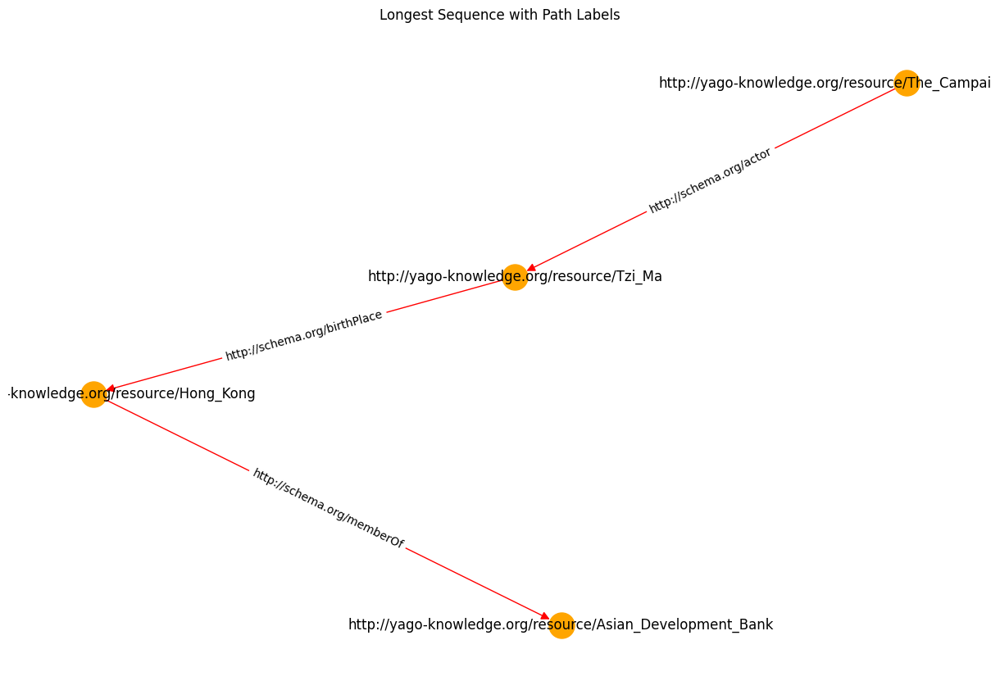

In [21]:
# Find the longest path
try:
    longest_path = find_long_sequences(graph)
    print("Longest Path:", longest_path)

    # Visualize only the longest path
    visualize_long_sequence_with_labels(graph, longest_path)
except ValueError as e:
    print(e)

In [6]:
keys = list(data.keys())

In [38]:
data[keys[0]]['entities']

[{'id': 1294448,
  'label': 'Ági Szalóki',
  'description': 'Hungarian singer',
  'span': 'Ági Szalóki',
  'url': 'https://www.wikidata.org/wiki/Q1294448'},
 {'id': 244615,
  'label': "Conway's Game of Life",
  'description': '2D cellular automaton devised by J. H. Conway in 1970: cells, arranged in a square grid, are either alive or dead; a live cell with 2 or 3 live neighbors survives; a dead cell with 3 live neighbors becomes alive; otherwise the cell dies/stays dead',
  'span': 'Life',
  'url': 'https://www.wikidata.org/wiki/Q244615'},
 {'id': 1340307,
  'label': 'toddler',
  'description': 'child 12 to 36 months old',
  'span': 'toddler',
  'url': 'https://www.wikidata.org/wiki/Q1340307'},
 {'id': 236312,
  'label': 'Márta Sebestyén',
  'description': 'Hungarian singer',
  'span': 'Márta Sebestyén',
  'url': 'https://www.wikidata.org/wiki/Q236312'},
 {'id': 1136974,
  'label': 'role model',
  'description': 'person who models a social role for other people, intentionally or uninte

In [8]:
candidate_nodes = extract_ids_with_prefix(data[keys[0]]['entities'])

In [9]:
len(extract_ids_with_prefix(data[keys[0]]['entities']))

40

In [39]:
extract_ids_with_prefix(data[keys[0]]['entities'])

['Q1294448',
 'Q244615',
 'Q1340307',
 'Q236312',
 'Q1136974',
 'Q4839635',
 'Q235858',
 'Q7302601',
 'Q1792644',
 'Q204',
 'Q215380',
 'Q2088357',
 'Q16502',
 'Q340',
 'Q309066',
 'Q397',
 'Q90',
 'Q60',
 'Q282049',
 'Q188451',
 'Q8341',
 'Q182659',
 'Q7569',
 'Q482994',
 'Q1942675',
 'Q15700638',
 'Q910744',
 'Q178588',
 'Q638',
 'Q21146257',
 'Q283',
 'Q2637489',
 'Q1068295',
 'Q170584',
 'Q482',
 'Q48672559',
 'Q575650',
 'Q236097',
 'Q966706',
 'Q182832']

In [10]:
exclude_props = ['image', 'about', 'comment', 'gtin', 'url', 'label', 'postalCode', 'isbn', 'sameAs', 'mainEntityOfPage', 'leiCode', 'type', 'dateCreated', 'unemploymentRate', 'length', 'description', 'iswcCode', 'iataCode', 'logo', 'alternateName', 'geo', 'subclassOf', 'icaoCode', 'humanDevelopmentIndex', 'sameAs', 'dateCreated', 'startDate', 'endDate', 'follows', 'superEvent']

In [13]:
# exclude_props = ['schema:image','schema:about', 'rdfs:comment', 'schema:gtin', 'schema:url', 'rdfs:label', 'schema:postalCode', 'schema:isbn', 'schema:sameAs', 'schema:mainEntityOfPage', 'schema:leiCode', 'rdf:type', 'schema:dateCreated', 'yago:unemploymentRate', 'yago:length', 'schema:description', 'yago:iswcCode', 'schema:iataCode', 'schema:logo', 'schema:alternateName', 'schema:geo', 'rdfs:subclassOf', 'schema:icaoCode', 'yago:humanDevelopmentIndex', 'owl:sameAs', 'schema:dateCreated', 'schema:startDate', 'schema:endDate', 'yago:follows', 'schema:superEvent']

# def get_yago_query_direct_neighbors(entity_id, max_limit=1000, exclude_properties=exclude_props, format_yago_prefix=True):
#     """
#     Generates a SPARQL query for a given YAGO entity ID, with an option to exclude specific properties.

#     Args:
#         entity_id (str): The YAGO entity ID.
#         max_limit (int): Maximum number of results to return.
#         exclude_properties (list): List of properties to exclude.
#         format_yago_prefix (bool): Whether to format the entity ID to use the YAGO prefix.

#     Returns:
#         str: A SPARQL query as a string.
#     """
#     if format_yago_prefix:
#         entity_id = entity_id.replace('http://yago-knowledge.org/resource/', 'yago:')
    
#     # Default exclusion list if none provided
#     if exclude_properties is None:
#         exclude_properties = [
#             "rdfs:comment", "rdfs:label", "rdf:type", 
#             "schema:description", "schema:alternateName", 
#             "schema:mainEntityOfPage", "schema:image", "schema:sameAs"
#         ]
        
    
    
#     # Dynamically create the FILTER clause
#     exclude_filter = "FILTER (?pred NOT IN ({}))".format(", ".join(exclude_properties))
    
#     query_template = f"""
#     PREFIX schema: <http://schema.org/>
#     PREFIX yago: <http://yago-knowledge.org/resource/>
#     PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
#     PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>

#     SELECT DISTINCT ?sub ?pred ?obj WHERE {{
#         {{
#             {entity_id} ?pred ?obj .
#         }}
#         UNION
#         {{
#             ?sub ?pred {entity_id} .
#         }}
#         {exclude_filter}
#     }}
#     LIMIT {max_limit}
#     """
#     return query_template

In [14]:
# yagoID = convert_QID_yagoID(candidate_nodes[1])
# query = get_yago_query_direct_neighbors(yagoID)
# response = query_kg(yago_endpoint_url, query)

In [15]:
# print(query)

In [16]:
# response

In [17]:
# yago_endpoint_url = "http://localhost:9999/bigdata/sparql"
# query = """
# PREFIX schema: <http://schema.org/>
# PREFIX yago: <http://yago-knowledge.org/resource/>
# PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
# PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>

# SELECT DISTINCT ?sub ?pred ?obj WHERE {
#     {
#         yago:Barack_Obama ?pred ?obj .
#     }
#     UNION
#     {
#         ?sub ?pred yago:Barack_Obama .
#     }
#     FILTER (?pred NOT IN (rdfs:comment, rdfs:label, rdf:type, schema:description, schema:alternateName, schema:mainEntityOfPage, schema:image,schema:sameAs))
# }
# LIMIT 1000
# """
# response = query_kg(yago_endpoint_url, query)

In [11]:
candidate_nodes

['Q1294448',
 'Q244615',
 'Q1340307',
 'Q236312',
 'Q1136974',
 'Q4839635',
 'Q235858',
 'Q7302601',
 'Q1792644',
 'Q204',
 'Q215380',
 'Q2088357',
 'Q16502',
 'Q340',
 'Q309066',
 'Q397',
 'Q90',
 'Q60',
 'Q282049',
 'Q188451',
 'Q8341',
 'Q182659',
 'Q7569',
 'Q482994',
 'Q1942675',
 'Q15700638',
 'Q910744',
 'Q178588',
 'Q638',
 'Q21146257',
 'Q283',
 'Q2637489',
 'Q1068295',
 'Q170584',
 'Q482',
 'Q48672559',
 'Q575650',
 'Q236097',
 'Q966706',
 'Q182832']

In [14]:
# Example usage
# candidate_nodes = ["node1", "node2", "node3", "node4", "node5"]
results = parallel_process_nodes(candidate_nodes)



Error: 400
Error: 400
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error converting QID to YagoID
Error: 400
Error: 400
done
done
done
Error converting QID to YagoID
done
Error: 400
done
done
done
done
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
done
done
Error converting QID to YagoID
Error: 400
Error converting QID to YagoID
Error: 400
done
done
done
done
done
done
done
done
done


In [23]:
# Print results
for index, result in results.items():
    print(f"Index {index}: {result}")

Index 0: {'error': 'not found'}
Index 1: []
Index 2: [('http://yago-knowledge.org/resource/Toddler', 'http://www.w3.org/2000/01/rdf-schema#subClassOf', 'http://yago-knowledge.org/resource/Child')]
Index 3: {'error': 'not found'}
Index 4: [('http://yago-knowledge.org/resource/Role_model', 'http://www.w3.org/2000/01/rdf-schema#subClassOf', 'http://schema.org/Person'), ('http://yago-knowledge.org/resource/Pioneers-heroes', 'http://www.w3.org/2000/01/rdf-schema#subClassOf', 'http://yago-knowledge.org/resource/Role_model')]
Index 5: [('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_', 'http://schema.org/actor', 'http://yago-knowledge.org/resource/Valerie_Hobson'), ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_', 'http://schema.org/actor', 'http://yago-knowledge.org/resource/Norman_Wooland'), ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_', 'http://schema.org/actor', 'http://yago-knowledge.org/resource/Philip_Friend'), (

In [15]:
comb_list = combine_lists_from_dict(results)

In [16]:
len(comb_list)

3321

In [ ]:
processed_triples = []
for triple in range(len(comb_list)):
    predicate = str(triple[1]).lower()
    # print(predicate)
    exclude = False
    for substring in exclude_props:
        if substring.lower() in predicate:
            
            exclude = True
            break
    if exclude:
        print(f'{predicate}, {substring} - excluded')
        continue
    else:
        processed_triples.append(triple)

http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http://www.w3.org/2000/01/rdf-schema#subclassof, subclassOf - excluded
http:/

In [24]:
len(processed_triples)

3060

In [40]:
processed_triples

[('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Valerie_Hobson'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Norman_Wooland'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Philip_Friend'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/contentLocation',
  'http://yago-knowledge.org/resource/London'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/director',
  'http://yago-knowledge.org/resource/Daniel_Birt'),
 ('http://yago-knowledge.org/resource/Montreal',
  'http://schema.org/award',
  'http://yago-knowledge.org/resource/Design_Cities__u0028_UNESCO_u0029_'),
 ('http://yago-knowledge.org/resource/Montrea

In [31]:
processed_triples[9][1]

'http://schema.org/location'

In [53]:
exclude_props[-9].lower()

'subclassof'

In [48]:
exclude_props

['image',
 'about',
 'comment',
 'gtin',
 'url',
 'label',
 'postalCode',
 'isbn',
 'sameAs',
 'mainEntityOfPage',
 'leiCode',
 'type',
 'dateCreated',
 'unemploymentRate',
 'length',
 'description',
 'iswcCode',
 'iataCode',
 'logo',
 'alternateName',
 'geo',
 'subclassOf',
 'icaoCode',
 'humanDevelopmentIndex',
 'sameAs',
 'dateCreated',
 'startDate',
 'endDate',
 'follows',
 'superEvent']

In [51]:
exclude_props[-9].lower() in 'http://www.w3.org/2000/01/rdf-schema#subclassof'

True

In [60]:
len(processed_triples)

3060

In [36]:
processed_triples

[('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Valerie_Hobson'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Norman_Wooland'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/actor',
  'http://yago-knowledge.org/resource/Philip_Friend'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/contentLocation',
  'http://yago-knowledge.org/resource/London'),
 ('http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_',
  'http://schema.org/director',
  'http://yago-knowledge.org/resource/Daniel_Birt'),
 ('http://yago-knowledge.org/resource/Leonard_Cohen',
  'http://schema.org/homeLocation',
  'http://yago-knowledge.org/resource/Montreal'),
 ('http://yago-knowledge.org/resource/Norma_Shearer',
  'ht

3321

In [21]:
# triples_list = sparql_to_triples_with_main_entity(response["results"]["bindings"], yagoID)

In [32]:
import networkx as nx
import matplotlib.pyplot as plt

def create_graph_from_triples(triples):
    """
    Creates a NetworkX graph from a list of triples.

    Args:
        triples (list of tuples): List of triples in the format (subj, pred, obj).

    Returns:
        nx.DiGraph: A directed graph representing the triples.
    """
    graph = nx.DiGraph()  # Create a directed graph

    for subj, pred, obj in triples:
        # Add nodes and edges
        graph.add_edge(subj, obj, predicate=pred)

    return graph

In [34]:
# Create the graph
graph = create_graph_from_triples(processed_triples)

# Print information about the graph
print("Nodes:")
print(graph.nodes())
print("\nEdges:")
print(graph.edges(data=True))

# # Draw the graph (optional)
# try:
#     pos = nx.spring_layout(graph)  # Layout for nodes
#     plt.figure(figsize=(10, 8))
#     nx.draw(graph, pos, with_labels=False, node_size=3000, font_size=10, font_weight='bold', arrowsize=20)
#     edge_labels = nx.get_edge_attributes(graph, 'predicate')
#     nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels, font_size=8)
#     plt.title("Triple Graph")
#     plt.show()
# except ImportError:
#     print("Matplotlib is not installed. Skipping graph visualization.")

Nodes:
['http://yago-knowledge.org/resource/Background__u0028_1953_film_u0029_', 'http://yago-knowledge.org/resource/Valerie_Hobson', 'http://yago-knowledge.org/resource/Norman_Wooland', 'http://yago-knowledge.org/resource/Philip_Friend', 'http://yago-knowledge.org/resource/London', 'http://yago-knowledge.org/resource/Daniel_Birt', 'http://yago-knowledge.org/resource/Montreal', 'http://yago-knowledge.org/resource/Design_Cities__u0028_UNESCO_u0029_', 'http://yago-knowledge.org/resource/Jeanne_Mance', 'http://yago-knowledge.org/resource/Paul_de_Chomedey_u002C__Sieur_de_Maisonneuve', 'http://yago-knowledge.org/resource/Canada', 'http://yago-knowledge.org/resource/Urban_agglomeration_of_Montreal', 'http://yago-knowledge.org/resource/Island_of_Montreal', 'http://yago-knowledge.org/resource/League_of_Historical_Cities', 'Concordia Salus', '498', 'Montréalais', 'Montréalaise', 'Montrealano', 'Montrealer', 'منتريالي', 'منترياليات', 'منتريالية', 'منترياليون', '31', 'http://yago-knowledge.org/re

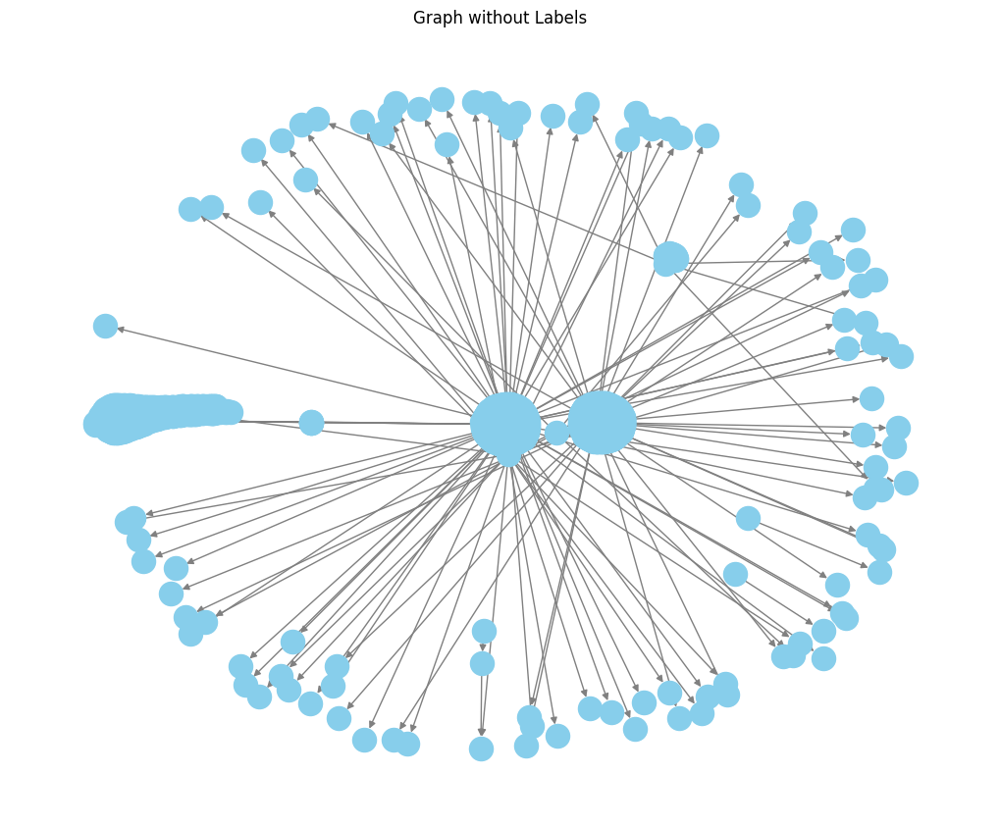

In [37]:

# Draw the graph without labels
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(graph)  # Layout for nodes
nx.draw(graph, pos, node_size=300, node_color="skyblue", arrowsize=10, edge_color="gray")
plt.title("Graph without Labels")
plt.show()

In [35]:
def find_long_sequences(graph):
    """
    Finds long sequences in a directed graph, avoiding loops.

    Args:
        graph (nx.DiGraph): The directed graph.

    Returns:
        list: A list of long sequences (paths).
    """
    def dfs(node, visited, path):
        """
        Depth-First Search helper to explore paths.
        """
        visited.add(node)
        path.append(node)

        for neighbor in graph.successors(node):
            if neighbor not in visited:  # Avoid loops
                dfs(neighbor, visited, path)

        # Record the path if it's the longest so far
        nonlocal longest_path
        if len(path) > len(longest_path):
            longest_path = path[:]

        # Backtrack
        path.pop()
        visited.remove(node)

    longest_path = []
    visited = set()

    # Start DFS from every node
    for node in graph.nodes:
        dfs(node, visited, [])

    return longest_path

def visualize_longest_path_only(graph, longest_path):
    """
    Visualizes only the longest path in the graph.

    Args:
        graph (nx.DiGraph): The directed graph.
        longest_path (list): Nodes in the longest path.
    """
    # Create a subgraph with only the longest path
    path_edges = list(zip(longest_path[:-1], longest_path[1:]))
    subgraph = nx.DiGraph()
    subgraph.add_edges_from(path_edges)

    pos = nx.spring_layout(subgraph)  # Layout for nodes
    plt.figure(figsize=(12, 10))

    # Draw the longest path subgraph
    nx.draw(subgraph, pos, node_size=300, node_color="orange", edge_color="red", with_labels=True, arrowsize=10)
    plt.title("Longest Path Subgraph")
    plt.show()
    
def visualize_long_sequence_with_labels(graph, sequence):
    """
    Visualizes the longest sequence in the graph and labels the paths.

    Args:
        graph (nx.DiGraph): The original graph.
        sequence (list): Longest sequence of nodes.
    """
    # Create a subgraph for the longest sequence
    path_edges = list(zip(sequence[:-1], sequence[1:]))
    subgraph = nx.DiGraph()
    subgraph.add_edges_from(path_edges)

    # Assign edge labels from the original graph
    edge_labels = {(u, v): graph[u][v]['predicate'] for u, v in path_edges}

    # Layout for the subgraph
    pos = nx.spring_layout(subgraph)

    # Draw the subgraph
    plt.figure(figsize=(12, 8))
    nx.draw(subgraph, pos, with_labels=True, node_size=500, node_color="orange", edge_color="red", arrowsize=15)
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=10)
    plt.title("Longest Sequence with Path Labels")
    plt.show()

Longest Path: ['http://yago-knowledge.org/resource/Urban_agglomeration_of_Montreal', 'http://yago-knowledge.org/resource/Montreal', 'http://yago-knowledge.org/resource/Design_Cities__u0028_UNESCO_u0029_']


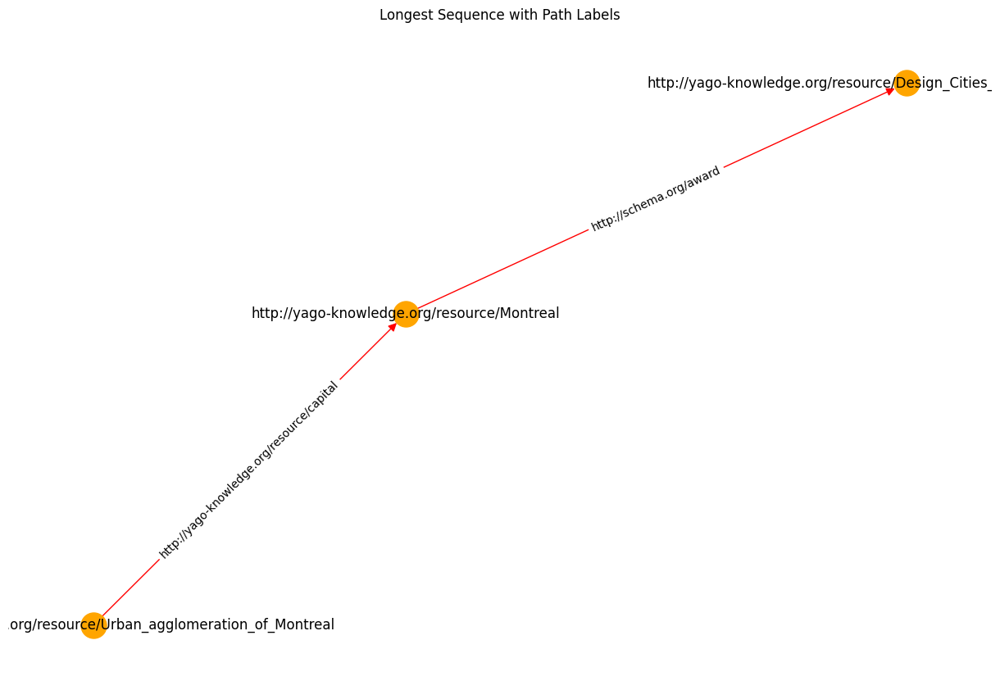

In [36]:
# Find the longest path
try:
    longest_path = find_long_sequences(graph)
    print("Longest Path:", longest_path)

    # Visualize only the longest path
    visualize_long_sequence_with_labels(graph, longest_path)
except ValueError as e:
    print(e)

In [40]:
text = '''
('yago:doctoralAdvisor', None, 30389)
('schema:lyricist', None, 40637)
('yago:director', None, 531)
('schema:image', None, 4417230) #must_ignore
('schema:mainEntityOfPage', None, 56934835) #must_ignore
('schema:dateCreated', None, 8059325) #must_ignore
('schema:worksFor', None, 1599538)
('schema:superEvent', None, 295692)
('yago:radialVelocity', None, 3729707)
('schema:alternateName', None, 11687128)
('yago:parentBody', None, 10163)
('schema:iataCode', None, 2729)
('schema:founder', None, 48849)
('schema:spouse', None, 748093)
('schema:author', None, 3932471)
('schema:numberOfEmployees', None, 43381)
('yago:iswcCode', None, 7509)
('schema:actor', None, 1336197)
('yago:populationNumber', None, 787313)
('schema:slogan', None, 282)
('schema:editor', None, 7296)
('schema:nationality', None, 3345406)
('yago:terminus', None, 32904)
('schema:alumniOf', None, 2421383)
('owl:sameAs', None, 49625390)
('yago:highestPoint', None, 5385)
('yago:playsIn', None, 153644)
('schema:memberOf', None, 2403017)
('schema:numberOfEpisodes', None, 41245)
('schema:manufacturer', None, 170896)
('yago:elevation', None, 1327393)
('yago:influencedBy', None, 14144)
('yago:neighbors', None, 881270)
('schema:location', None, 22480649)
('schema:duration', None, 116914)
('schema:deathDate', None, 2988392)
('yago:distanceFromEarth', None, 2993716)
('yago:flowsInto', None, 119618)
('schema:material', None, 1331078)
('schema:award', None, 1303269)
('schema:startDate', None, 117270)
('yago:unemploymentRate', None, 196)
('schema:isbn', None, 22538) #must_ignore?
('schema:postalCode', None, 565447)
('schema:endDate', None, 109074)
('yago:conferredBy', None, 9098)
('schema:icaoCode', None, 3350)
('yago:studentOf', None, 3488)
('yago:replaces', None, 54850)
('yago:lowestPoint', None, 422)
('yago:luminosity', None, 5479)
('yago:demonym', None, 26494)
('yago:mass', None, 9536)
('schema:deathPlace', None, 1256549)
('schema:homeLocation', None, 307370)
('schema:duns', None, 219)
('schema:inLanguage', None, 3499806)
('schema:birthPlace', None, 3127387)
('schema:gender', None, 8600962)
('schema:url', None, 1653900) #must_ignore
('schema:dissolutionDate', None, 144002)
('yago:leader', None, 34702)
('schema:performer', None, 24046)
('schema:parentTaxon', None, 3624769)
('yago:follows', None, 287223)
('yago:ownedBy', None, 415573)
('yago:consumes', None, 221)
('yago:sportNumber', None, 25401)
('yago:participant', None, 629356)
('schema:musicBy', None, 214634)
('schema:illustrator', None, 2316)
('yago:academicDegree', None, 209364)
('schema:publisher', None, 51348)
('yago:beliefSystem', None, 233045)
('rdfs:comment', None, 94679132) #7667860 #must_ignore
('schema:director', None, 311849)
('schema:organizer', None, 80408)
('schema:numberOfSeasons', None, 30657)
('yago:studentsCount', None, 70966)
('schema:affiliation', None, 57355)
('schema:sponsor', None, 60922)
('schema:leiCode', None, 35918) #must_ignore?
('schema:owns', None, 13810)
('yago:area', None, 643020)
('schema:contentLocation', None, 87611)
('schema:productionCompany', None, 79100)
('rdfs:label', None, 129602074)
('schema:birthDate', None, 5912472)
('yago:capital', None, 40334)
('yago:appearsIn', None, 136053)
('schema:sameAs', None, 11567698)
('yago:humanDevelopmentIndex', None, 169)
('schema:knowsLanguage', None, 2545269)
('yago:parallax', None, 3623787)
('yago:length', None, 94259) #must_ignore?
('schema:gtin', None, 167) #must_ignore?
('schema:address', None, 43072)
('schema:logo', None, 63498) #must_ignore
('schema:recordLabel', None, 289)
('rdf:type', None, 52817258)
('yago:candidateIn', None, 145027)
('schema:locationCreated', None, 484999)
('schema:numberOfPages', None, 15731)
('yago:officialLanguage', None, 452)
('schema:about', None, 2925998)
('yago:notableWork', None, 74321)
('schema:children', None, 1621678)

'''

In [42]:
import re



def extract_uninteresting_properties(text):
    """
    Extracts uninteresting properties with #must_ignore or #must_ignore? from the given text.

    Args:
        text (str): The input text.

    Returns:
        list: A list of uninteresting properties.
    """
    pattern = r"\('([^']+)', None, \d+\) #must_ignore"
    return re.findall(pattern, text)

# Extract properties
uninteresting_properties = extract_uninteresting_properties(text)

# Print the result
print(uninteresting_properties)


['schema:image', 'schema:mainEntityOfPage', 'schema:dateCreated', 'schema:isbn', 'schema:url', 'schema:leiCode', 'yago:length', 'schema:gtin', 'schema:logo']


In [ ]:
['schema:image', 'schema:mainEntityOfPage', 'schema:dateCreated', 'schema:isbn', 'schema:url', 'schema:leiCode', 'yago:length', 'schema:gtin', 'schema:logo']


In [46]:
exclude = [
    "schema:image",
    "schema:mainEntityOfPage",
    "schema:dateCreated",
    "schema:iataCode",
    "yago:iswcCode",
    "owl:sameAs",
    "yago:unemploymentRate",
    "schema:isbn",
    "schema:postalCode",
    "schema:icaoCode",
    "schema:url",
    "rdfs:comment",
    "schema:leiCode",
    "yago:humanDevelopmentIndex",
    "yago:length",
    "schema:gtin",
    "schema:logo",
    "schema:geo",
    "rdfs:subclassOf"
]
exclude_properties = [
            "rdfs:comment", "rdfs:label", "rdf:type", 
            "schema:description", "schema:alternateName", 
            "schema:mainEntityOfPage", "schema:image", "schema:sameAs"
        ]

In [48]:
pp = list(set(exclude+exclude_properties))
print(pp)

['schema:image', 'rdfs:comment', 'schema:gtin', 'schema:url', 'rdfs:label', 'schema:postalCode', 'schema:isbn', 'schema:sameAs', 'schema:mainEntityOfPage', 'schema:leiCode', 'rdf:type', 'schema:dateCreated', 'yago:unemploymentRate', 'yago:length', 'schema:description', 'yago:iswcCode', 'schema:iataCode', 'schema:logo', 'schema:alternateName', 'schema:geo', 'rdfs:subclassOf', 'schema:icaoCode', 'yago:humanDevelopmentIndex', 'owl:sameAs']


In [26]:

yago_endpoint_url = "http://localhost:9999/bigdata/sparql"
exclude_props = ['schema:image','schema:about', 'rdfs:comment', 'schema:gtin', 'schema:url', 'rdfs:label', 'schema:postalCode', 'schema:isbn', 'schema:sameAs', 'schema:mainEntityOfPage', 'schema:leiCode', 'rdf:type', 'schema:dateCreated', 'yago:unemploymentRate', 'yago:length', 'schema:description', 'yago:iswcCode', 'schema:iataCode', 'schema:logo', 'schema:alternateName', 'schema:geo', 'rdfs:subclassOf', 'schema:icaoCode', 'yago:humanDevelopmentIndex', 'owl:sameAs', 'schema:dateCreated', 'schema:startDate', 'schema:endDate', 'yago:follows', 'schema:superEvent']

def get_yago_query_direct_neighbors(entity_id, max_limit=1000, exclude_properties=exclude_props, format_yago_prefix=True):
    """
    Generates a SPARQL query for a given YAGO entity ID, with an option to exclude specific properties.

    Args:
        entity_id (str): The YAGO entity ID.
        max_limit (int): Maximum number of results to return.
        exclude_properties (list): List of properties to exclude.
        format_yago_prefix (bool): Whether to format the entity ID to use the YAGO prefix.

    Returns:
        str: A SPARQL query as a string.
    """
    if format_yago_prefix:
        entity_id = entity_id.replace('http://yago-knowledge.org/resource/', 'yago:')
    
    # Default exclusion list if none provided
    if exclude_properties is None:
        exclude_properties = [
            "rdfs:comment", "rdfs:label", "rdf:type", 
            "schema:description", "schema:alternateName", 
            "schema:mainEntityOfPage", "schema:image", "schema:sameAs"
        ]
        
    
    
    # Dynamically create the FILTER clause
    exclude_filter = "FILTER (?pred NOT IN ({}))".format(", ".join(exclude_properties))
    
    query_template = f"""
    PREFIX schema: <http://schema.org/>
    PREFIX yago: <http://yago-knowledge.org/resource/>
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>

    SELECT DISTINCT ?sub ?pred ?obj WHERE {{
        {{
            {entity_id} ?pred ?obj .
        }}
        UNION
        {{
            ?sub ?pred {entity_id} .
        }}
        {exclude_filter}
    }}
    LIMIT {max_limit}
    """
    return query_template

In [29]:
q = get_yago_query_direct_neighbors('http://yago-knowledge.org/resource/Toddler')
print(q)


    PREFIX schema: <http://schema.org/>
    PREFIX yago: <http://yago-knowledge.org/resource/>
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>

    SELECT DISTINCT ?sub ?pred ?obj WHERE {
        {
            yago:Toddler ?pred ?obj .
        }
        UNION
        {
            ?sub ?pred yago:Toddler .
        }
        FILTER (?pred NOT IN (schema:image, schema:about, rdfs:comment, schema:gtin, schema:url, rdfs:label, schema:postalCode, schema:isbn, schema:sameAs, schema:mainEntityOfPage, schema:leiCode, rdf:type, schema:dateCreated, yago:unemploymentRate, yago:length, schema:description, yago:iswcCode, schema:iataCode, schema:logo, schema:alternateName, schema:geo, rdfs:subclassOf, schema:icaoCode, yago:humanDevelopmentIndex, owl:sameAs, schema:dateCreated, schema:startDate, schema:endDate, yago:follows, schema:superEvent))
    }
    LIMIT 1000
    
